# Herschel-Stripe-82: Validation Checks (SUBSET)

In [1]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import numpy as np
from astropy.table import Table
import itertools

import time


In [2]:
t0 = time.time()

catname = "/data/help/master_catalogue_herschel-stripe-82_RANDOM10PCSAMPLE_20180113.fits"
master_catalogue = Table.read(catname)

print('Elapsed time(secs): ', time.time() - t0)

print("Number of sources in master catalogue: ", len(master_catalogue))

Elapsed time(secs):  390.73177313804626
Number of sources in master catalogue:  4924329


In [3]:
field = master_catalogue["field"][0]
field = field.rstrip()    # remove whitespaces at the end of the sting
print(field)

Herschel-Stripe-82


In [4]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

## 1/ Magnitude errors

In [9]:
u_bands = [ "SDSS u"]
g_bands = [ "SDSS g", "DECam g" ,"GPC1 g", "Suprime g", "RCS g"]
r_bands = [ "SDSS r", "DECam r" ,"GPC1 r", "Suprime r", "RCS r"]
i_bands = [ "SDSS i"            ,"GPC1 i", "Suprime i", "RCS i"]
z_bands = [ "SDSS z", "DECam z" ,"GPC1 z", "Suprime z", "RCS z"]
y_bands = [                      "GPC1 y", "Suprime y", "RCS y", "VHS Y", "UKIDSS Y"] 
J_bands = [                                                      "VHS J", "UKIDSS J", "VICS82 J"]
H_bands = [                                                      "VHS H", "UKIDSS H"]
K_bands = [                                                      "VHS K", "UKIDSS K", "VICS82 K"]

irac_mags = ["IRAC i1", "IRAC i2"]

opt_mags = u_bands + g_bands + r_bands + i_bands + z_bands + y_bands
ir_mags = J_bands + H_bands + K_bands + irac_mags

all_mags = opt_mags + ir_mags

all_bands = [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, J_bands, H_bands, K_bands]

In [6]:
def mag_vs_err(x, y, fig, ax, labels=("x", "y"), savefig=False):

    x_label, y_label = labels
    print(x_label)

    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & (x!=99.) & (y!=99.)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
   
    if len(x) == 0:
        print("No sources have {} values.".format(x_label))
        print("")
        return
  
    #"""
    if len(x) > 0:
        print("    Error max: {:.0f}".format(np.max(y)))
        err10 = y > 10
        if len(x[err10]) > 0:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.min(x[err10])))
        else:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.nan))
        err100 = y > 100
        if len(x[err100]) > 0:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.min(x[err100])))
        else:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.nan))
        err1000 = y > 1000
        if len(x[err1000]) > 0:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.min(x[err1000])))
        else:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.nan))
    else:
        print("    no data")
    print("")
    #"""

    # Plot
    ax.set_yscale('log')    # to place before scatter to avoid issues
    ax.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax.invert_xaxis()
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])

    # Save ex. fig
    if savefig:
        survey_label = ((x_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_magVSmagerr_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')

        

SDSS u mag (aperture)
    Error max: 29948
    magerr > 10: Number of objects = 6639, min mag = 28.1
    magerr > 100: Number of objects = 645, min mag = 30.9
    magerr > 1000: Number of objects = 61, min mag = 33.4

SDSS u mag (total)
    Error max: 64225
    magerr > 10: Number of objects = 8279, min mag = 26.0
    magerr > 100: Number of objects = 766, min mag = 29.0
    magerr > 1000: Number of objects = 73, min mag = 32.0



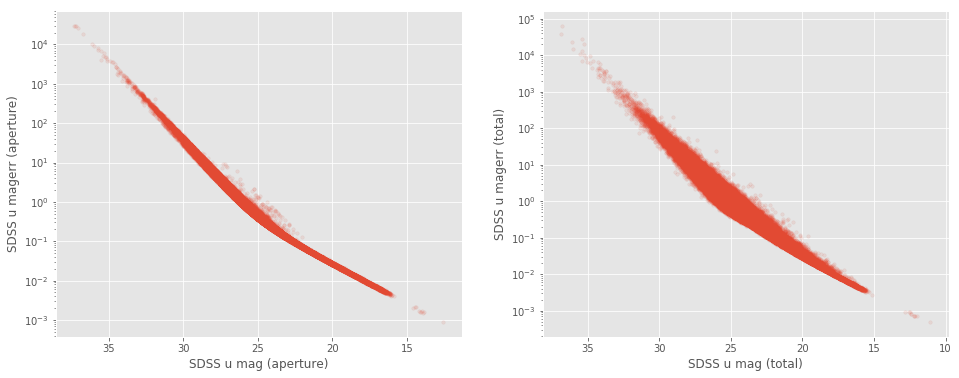

SDSS g mag (aperture)
    Error max: 43
    magerr > 10: Number of objects = 6, min mag = 29.7
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

SDSS g mag (total)
    Error max: 16044
    magerr > 10: Number of objects = 111, min mag = 27.9
    magerr > 100: Number of objects = 10, min mag = 30.7
    magerr > 1000: Number of objects = 1, min mag = 36.1



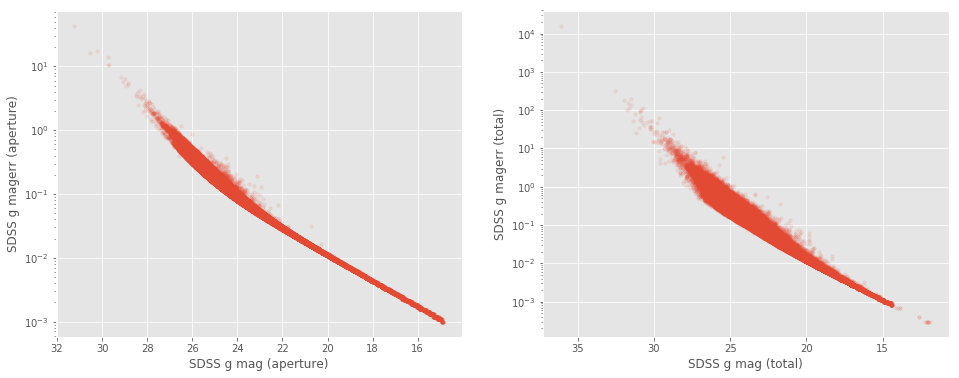

DECam g mag (aperture)
    Error max: 346517
    magerr > 10: Number of objects = 14437, min mag = 26.3
    magerr > 100: Number of objects = 1393, min mag = 29.8
    magerr > 1000: Number of objects = 152, min mag = 32.7

DECam g mag (total)
    Error max: 255500
    magerr > 10: Number of objects = 11709, min mag = 18.5
    magerr > 100: Number of objects = 1119, min mag = 22.5
    magerr > 1000: Number of objects = 104, min mag = 33.1



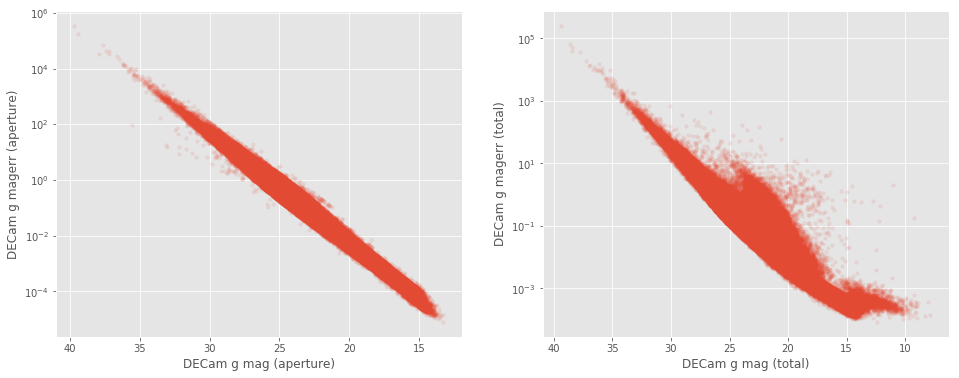

GPC1 g mag (aperture)
    Error max: 15851
    magerr > 10: Number of objects = 3734, min mag = 10.0
    magerr > 100: Number of objects = 367, min mag = 10.0
    magerr > 1000: Number of objects = 32, min mag = 29.6

GPC1 g mag (total)
    Error max: 37354
    magerr > 10: Number of objects = 4246, min mag = 10.1
    magerr > 100: Number of objects = 382, min mag = 10.1
    magerr > 1000: Number of objects = 28, min mag = 28.7



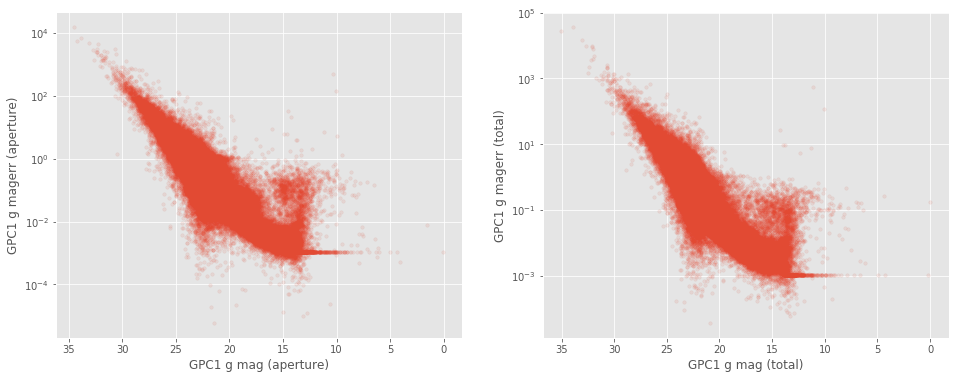

Suprime g mag (aperture)
    Error max: 50774
    magerr > 10: Number of objects = 2632, min mag = 29.1
    magerr > 100: Number of objects = 775, min mag = 32.1
    magerr > 1000: Number of objects = 214, min mag = 34.4

Suprime g mag (total)
    Error max: 21952479625216
    magerr > 10: Number of objects = 2208, min mag = 27.8
    magerr > 100: Number of objects = 705, min mag = 31.2
    magerr > 1000: Number of objects = 296, min mag = 34.5



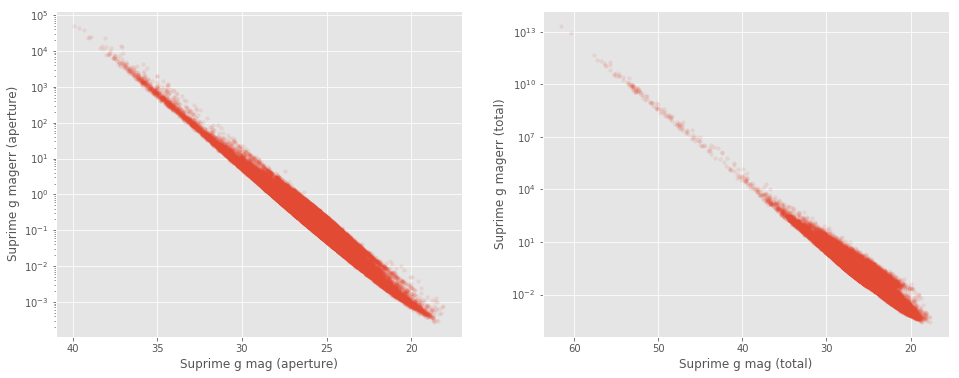

RCS g mag (aperture)
No sources have RCS g mag (aperture) values.

RCS g mag (total)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



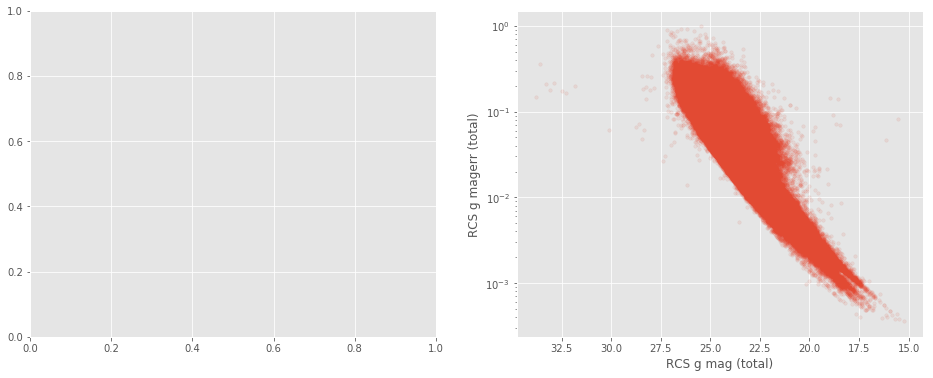

SDSS r mag (aperture)
    Error max: 244
    magerr > 10: Number of objects = 5, min mag = 29.1
    magerr > 100: Number of objects = 1, min mag = 32.4
    magerr > 1000: Number of objects = 0, min mag = nan

SDSS r mag (total)
    Error max: 3276
    magerr > 10: Number of objects = 48, min mag = 27.8
    magerr > 100: Number of objects = 6, min mag = 30.8
    magerr > 1000: Number of objects = 1, min mag = 34.7



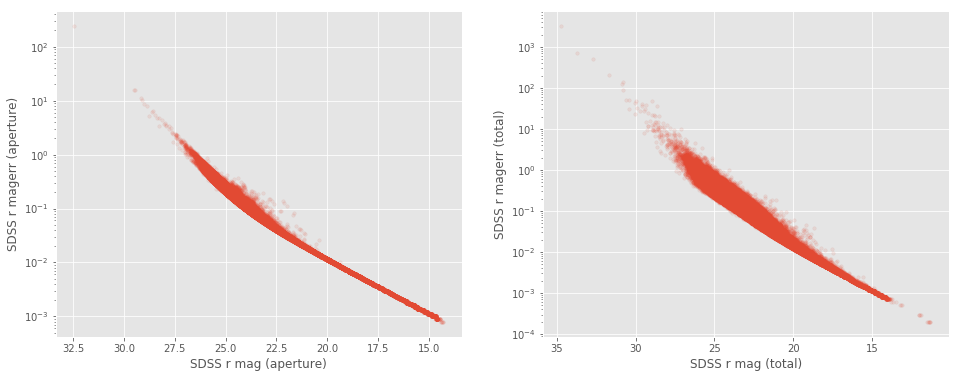

DECam r mag (aperture)
    Error max: 167280
    magerr > 10: Number of objects = 8311, min mag = 25.4
    magerr > 100: Number of objects = 782, min mag = 29.6
    magerr > 1000: Number of objects = 90, min mag = 32.0

DECam r mag (total)
    Error max: 264969
    magerr > 10: Number of objects = 2626, min mag = 15.8
    magerr > 100: Number of objects = 276, min mag = 17.2
    magerr > 1000: Number of objects = 38, min mag = 17.2



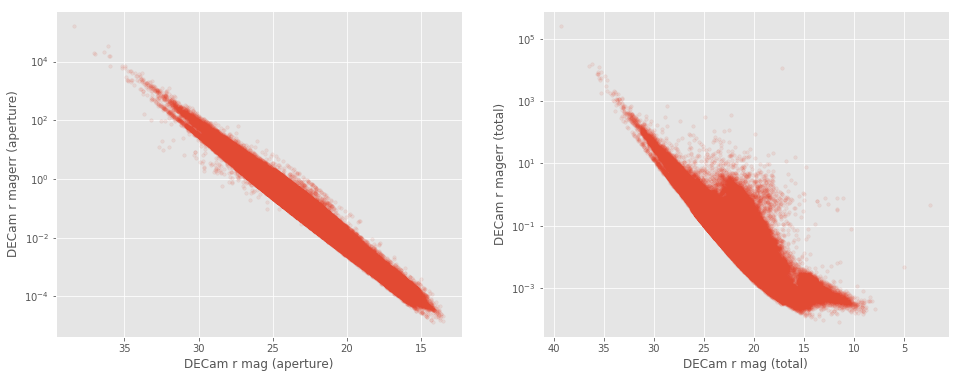

GPC1 r mag (aperture)
    Error max: 34690
    magerr > 10: Number of objects = 922, min mag = 10.1
    magerr > 100: Number of objects = 80, min mag = 11.9
    magerr > 1000: Number of objects = 13, min mag = 11.9

GPC1 r mag (total)
    Error max: 4242
    magerr > 10: Number of objects = 1026, min mag = 5.0
    magerr > 100: Number of objects = 94, min mag = 26.4
    magerr > 1000: Number of objects = 13, min mag = 29.5



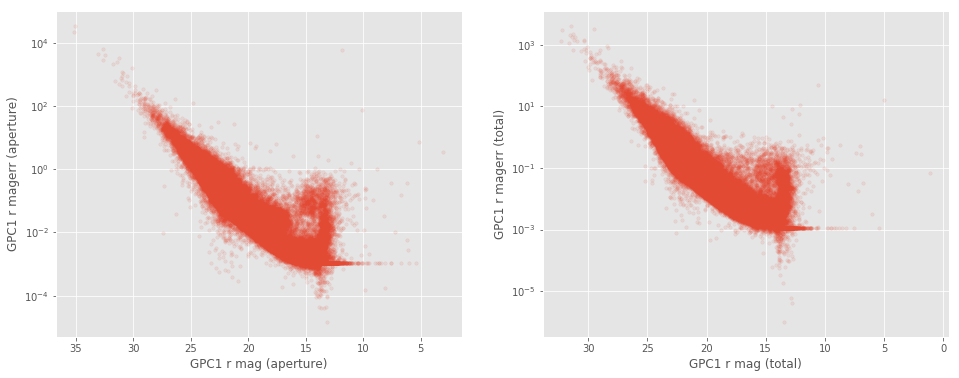

Suprime r mag (aperture)
    Error max: 330565
    magerr > 10: Number of objects = 1566, min mag = 28.9
    magerr > 100: Number of objects = 408, min mag = 31.6
    magerr > 1000: Number of objects = 101, min mag = 34.4

Suprime r mag (total)
    Error max: 40739622912
    magerr > 10: Number of objects = 1175, min mag = 27.8
    magerr > 100: Number of objects = 351, min mag = 30.1
    magerr > 1000: Number of objects = 137, min mag = 33.8



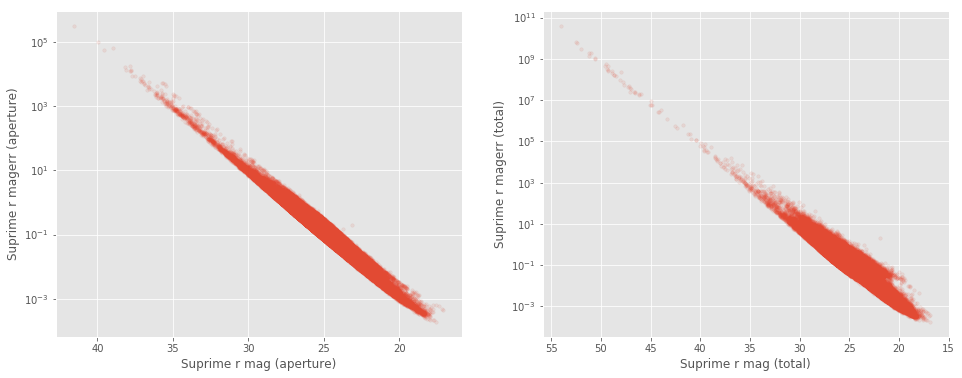

RCS r mag (aperture)
No sources have RCS r mag (aperture) values.

RCS r mag (total)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



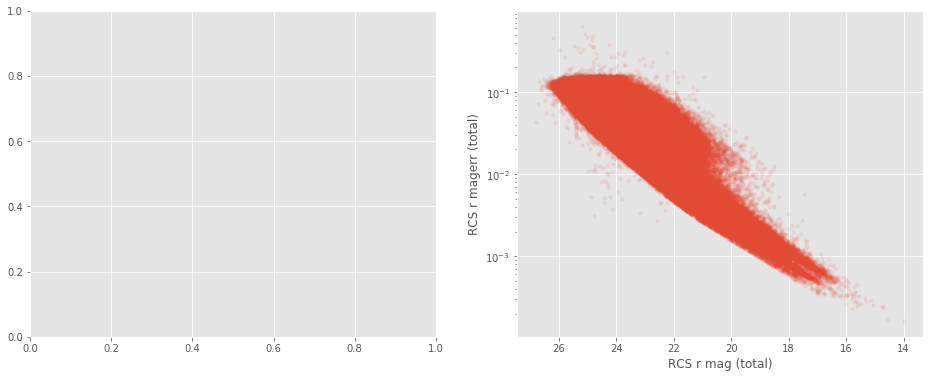

SDSS i mag (aperture)
    Error max: 19
    magerr > 10: Number of objects = 4, min mag = 29.0
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

SDSS i mag (total)
    Error max: 697
    magerr > 10: Number of objects = 62, min mag = 27.2
    magerr > 100: Number of objects = 3, min mag = 30.5
    magerr > 1000: Number of objects = 0, min mag = nan



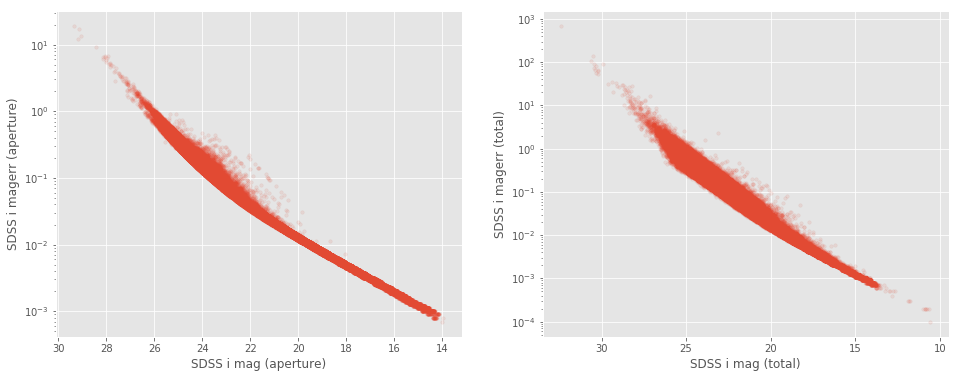

GPC1 i mag (aperture)
    Error max: 17360
    magerr > 10: Number of objects = 499, min mag = 12.4
    magerr > 100: Number of objects = 45, min mag = 24.1
    magerr > 1000: Number of objects = 3, min mag = 31.6

GPC1 i mag (total)
    Error max: 1541
    magerr > 10: Number of objects = 603, min mag = 8.2
    magerr > 100: Number of objects = 61, min mag = 8.2
    magerr > 1000: Number of objects = 6, min mag = 28.8



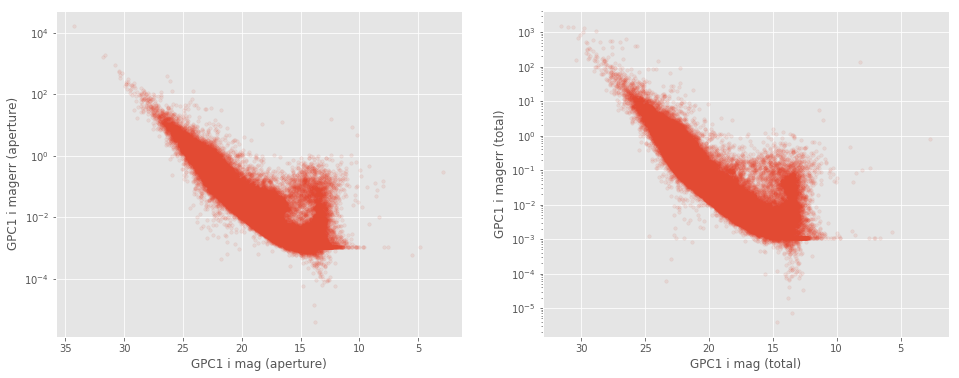

Suprime i mag (aperture)
    Error max: 662654
    magerr > 10: Number of objects = 1267, min mag = 28.7
    magerr > 100: Number of objects = 261, min mag = 30.7
    magerr > 1000: Number of objects = 63, min mag = 34.1

Suprime i mag (total)
    Error max: 169207513088
    magerr > 10: Number of objects = 880, min mag = 26.8
    magerr > 100: Number of objects = 167, min mag = 30.6
    magerr > 1000: Number of objects = 65, min mag = 33.9



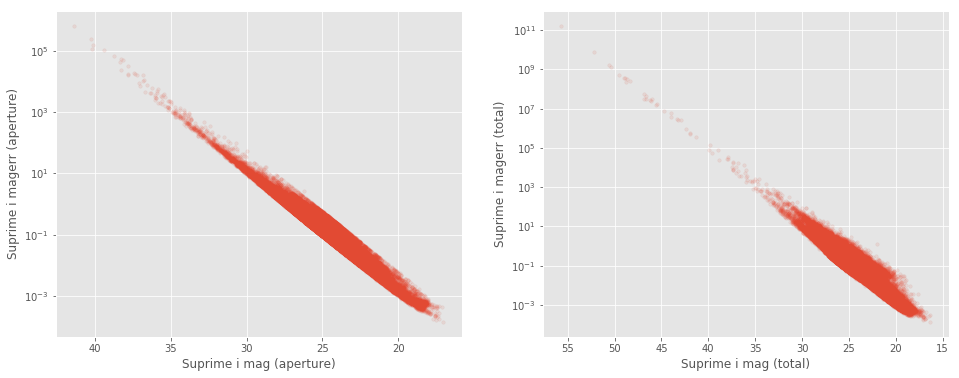

RCS i mag (aperture)
No sources have RCS i mag (aperture) values.

RCS i mag (total)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



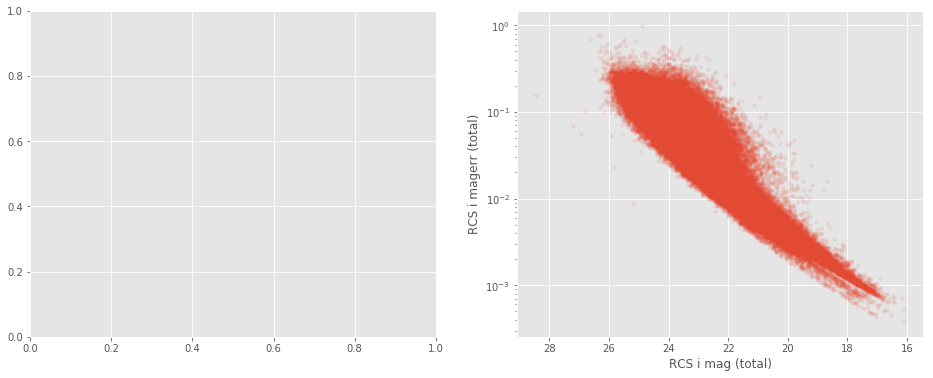

SDSS z mag (aperture)
    Error max: 38340
    magerr > 10: Number of objects = 2406, min mag = 26.9
    magerr > 100: Number of objects = 225, min mag = 29.5
    magerr > 1000: Number of objects = 26, min mag = 32.3

SDSS z mag (total)
    Error max: 135333
    magerr > 10: Number of objects = 4368, min mag = 25.2
    magerr > 100: Number of objects = 431, min mag = 27.9
    magerr > 1000: Number of objects = 47, min mag = 30.8



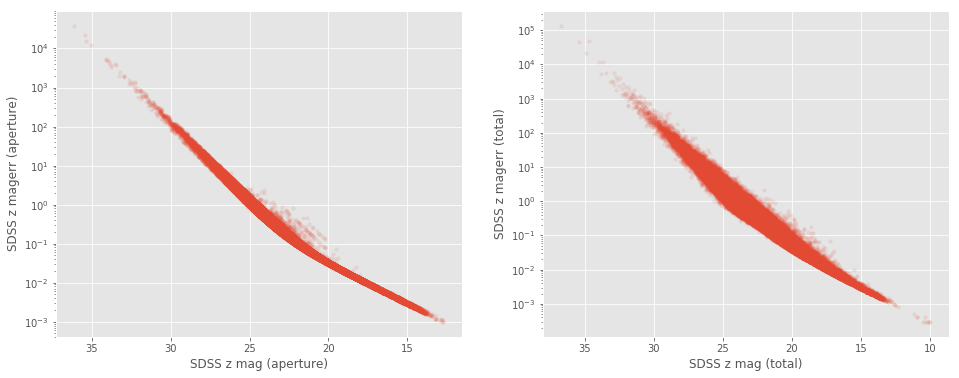

DECam z mag (aperture)
    Error max: 237832
    magerr > 10: Number of objects = 22485, min mag = 25.4
    magerr > 100: Number of objects = 2221, min mag = 28.2
    magerr > 1000: Number of objects = 226, min mag = 31.2

DECam z mag (total)
    Error max: 84212
    magerr > 10: Number of objects = 7811, min mag = 15.0
    magerr > 100: Number of objects = 800, min mag = 15.0
    magerr > 1000: Number of objects = 81, min mag = 25.9



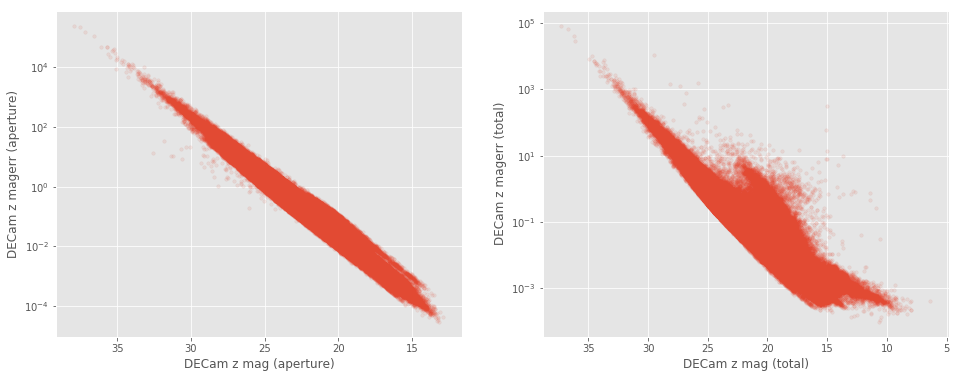

GPC1 z mag (aperture)
    Error max: 3616
    magerr > 10: Number of objects = 1096, min mag = 5.6
    magerr > 100: Number of objects = 91, min mag = 8.7
    magerr > 1000: Number of objects = 4, min mag = 22.6

GPC1 z mag (total)
    Error max: 10577
    magerr > 10: Number of objects = 1260, min mag = 6.2
    magerr > 100: Number of objects = 109, min mag = 10.2
    magerr > 1000: Number of objects = 12, min mag = 28.9



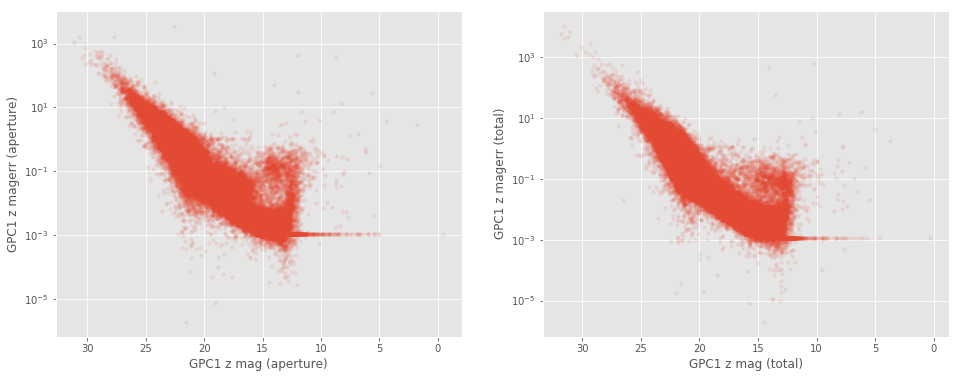

Suprime z mag (aperture)
    Error max: 78301
    magerr > 10: Number of objects = 3665, min mag = 27.7
    magerr > 100: Number of objects = 852, min mag = 30.5
    magerr > 1000: Number of objects = 188, min mag = 32.8

Suprime z mag (total)
    Error max: 12440139776
    magerr > 10: Number of objects = 2542, min mag = 26.3
    magerr > 100: Number of objects = 681, min mag = 29.7
    magerr > 1000: Number of objects = 236, min mag = 32.3



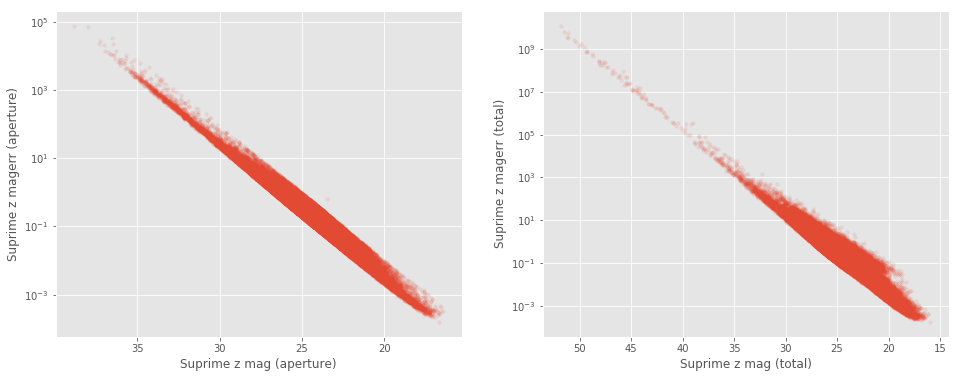

RCS z mag (aperture)
No sources have RCS z mag (aperture) values.

RCS z mag (total)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



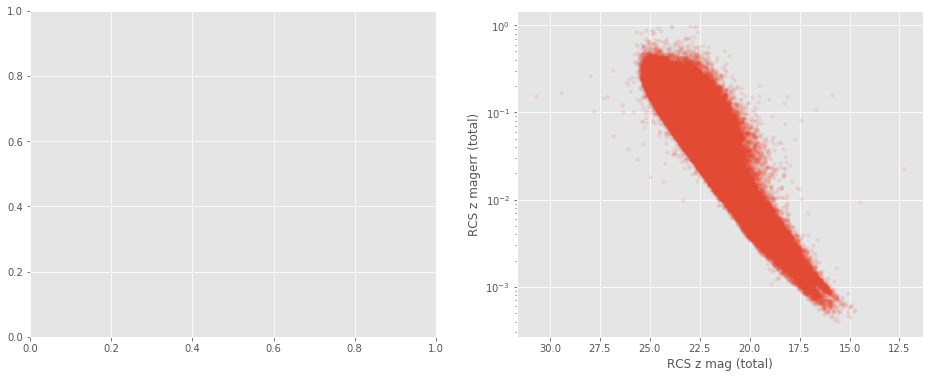

GPC1 y mag (aperture)
    Error max: 40760
    magerr > 10: Number of objects = 2366, min mag = 3.5
    magerr > 100: Number of objects = 217, min mag = 9.5
    magerr > 1000: Number of objects = 28, min mag = 9.5

GPC1 y mag (total)
    Error max: 8442
    magerr > 10: Number of objects = 3560, min mag = 3.8
    magerr > 100: Number of objects = 347, min mag = 7.8
    magerr > 1000: Number of objects = 30, min mag = 7.8



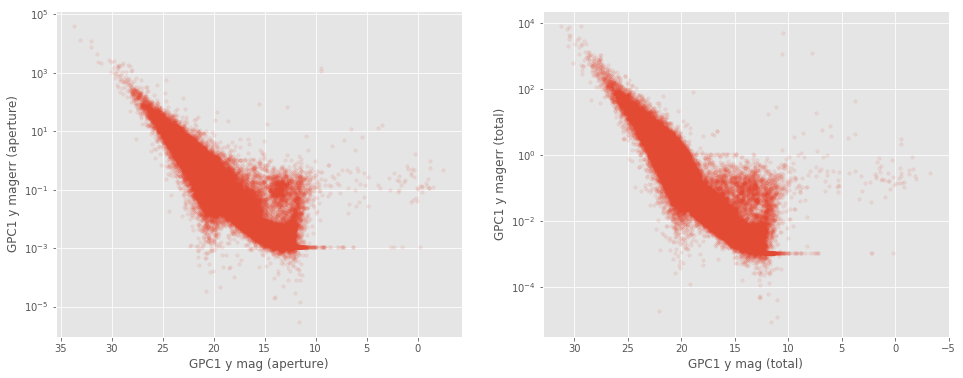

Suprime y mag (aperture)
    Error max: 203870
    magerr > 10: Number of objects = 5813, min mag = 26.9
    magerr > 100: Number of objects = 1164, min mag = 29.6
    magerr > 1000: Number of objects = 199, min mag = 32.7

Suprime y mag (total)
    Error max: 2536314112
    magerr > 10: Number of objects = 4077, min mag = 25.1
    magerr > 100: Number of objects = 917, min mag = 28.7
    magerr > 1000: Number of objects = 248, min mag = 32.1



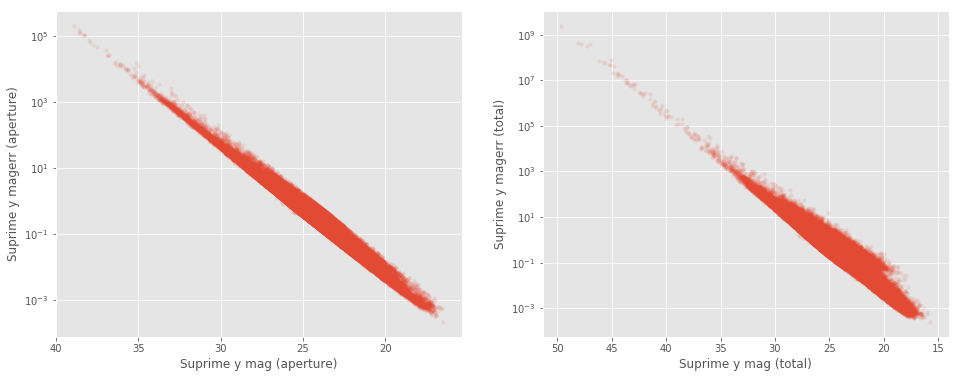

RCS y mag (aperture)
No sources have RCS y mag (aperture) values.

RCS y mag (total)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



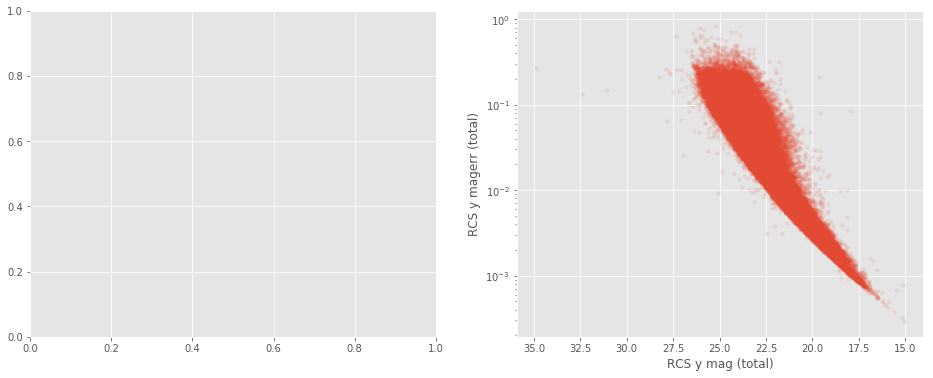

VHS Y mag (aperture)
    Error max: 9
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

VHS Y mag (total)
    Error max: 17678
    magerr > 10: Number of objects = 133, min mag = 21.5
    magerr > 100: Number of objects = 12, min mag = 26.8
    magerr > 1000: Number of objects = 1, min mag = 33.0



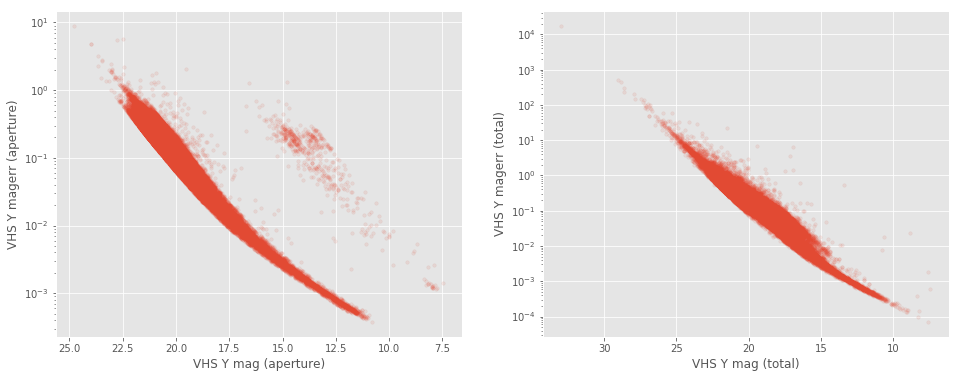

UKIDSS Y mag (aperture)
    Error max: 24
    magerr > 10: Number of objects = 4, min mag = 25.5
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS Y mag (total)
    Error max: 760
    magerr > 10: Number of objects = 86, min mag = 24.1
    magerr > 100: Number of objects = 10, min mag = 27.0
    magerr > 1000: Number of objects = 0, min mag = nan



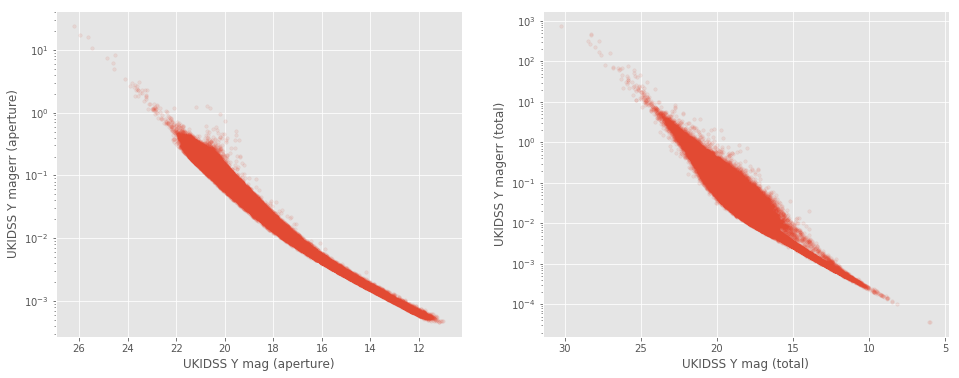

VHS J mag (aperture)
    Error max: 99
    magerr > 10: Number of objects = 7, min mag = 24.4
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

VHS J mag (total)
    Error max: 1443
    magerr > 10: Number of objects = 197, min mag = 19.9
    magerr > 100: Number of objects = 16, min mag = 26.7
    magerr > 1000: Number of objects = 1, min mag = 28.8



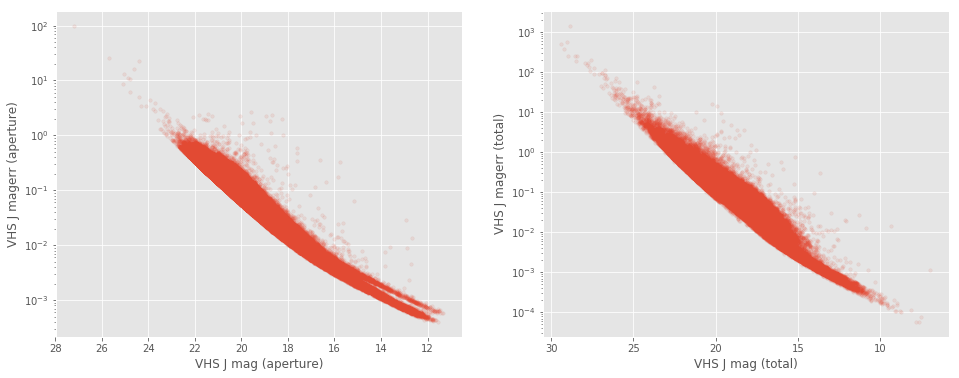

UKIDSS J mag (aperture)
    Error max: 343
    magerr > 10: Number of objects = 27, min mag = 24.6
    magerr > 100: Number of objects = 2, min mag = 27.5
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS J mag (total)
    Error max: 521
    magerr > 10: Number of objects = 32, min mag = 22.9
    magerr > 100: Number of objects = 5, min mag = 27.1
    magerr > 1000: Number of objects = 0, min mag = nan



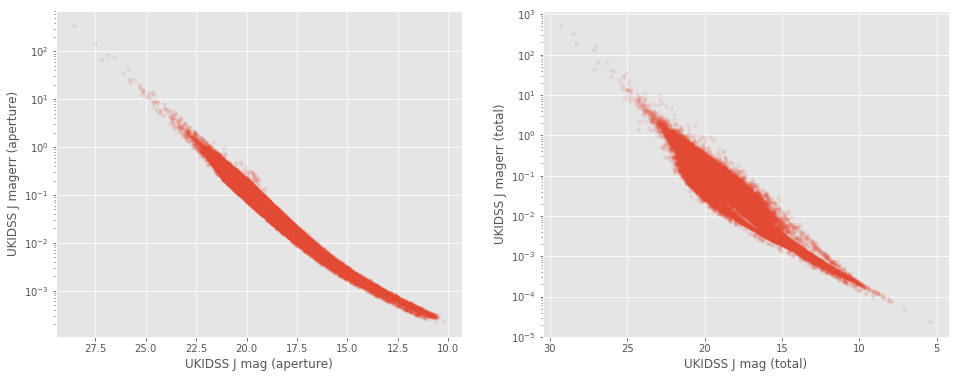

VICS82 J mag (aperture)
No sources have VICS82 J mag (aperture) values.

VICS82 J mag (total)
No sources have VICS82 J mag (total) values.



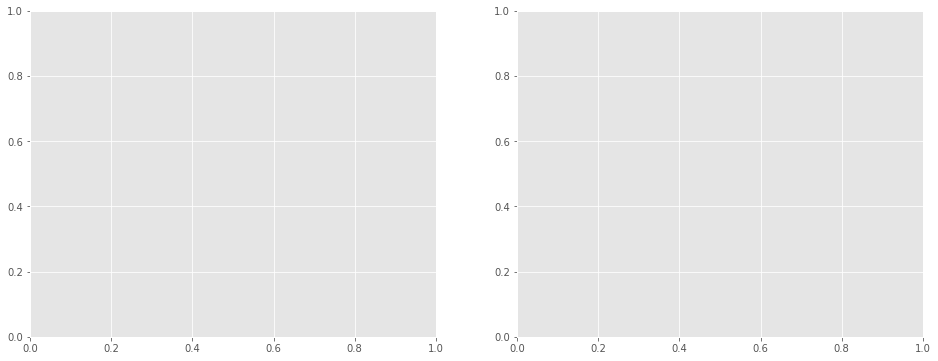

VHS H mag (aperture)
    Error max: 17
    magerr > 10: Number of objects = 4, min mag = 20.5
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

VHS H mag (total)
    Error max: 1765
    magerr > 10: Number of objects = 65, min mag = 20.6
    magerr > 100: Number of objects = 7, min mag = 25.6
    magerr > 1000: Number of objects = 1, min mag = 29.0



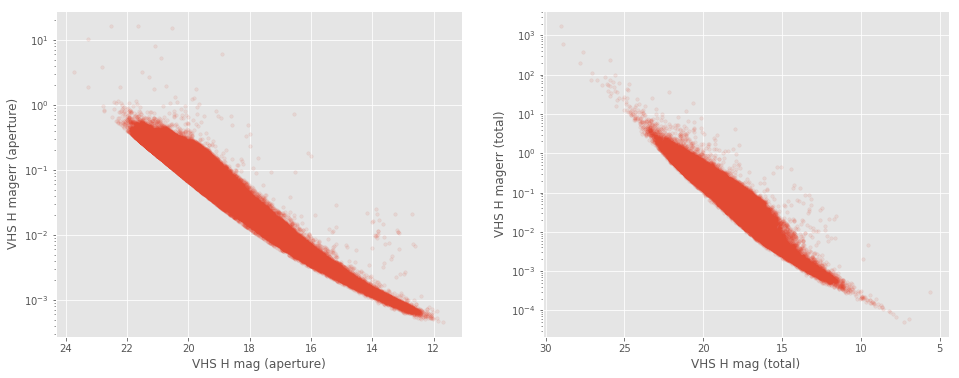

UKIDSS H mag (aperture)
    Error max: 36
    magerr > 10: Number of objects = 1, min mag = 25.7
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS H mag (total)
    Error max: 1654
    magerr > 10: Number of objects = 53, min mag = 22.9
    magerr > 100: Number of objects = 9, min mag = 26.3
    magerr > 1000: Number of objects = 1, min mag = 29.3



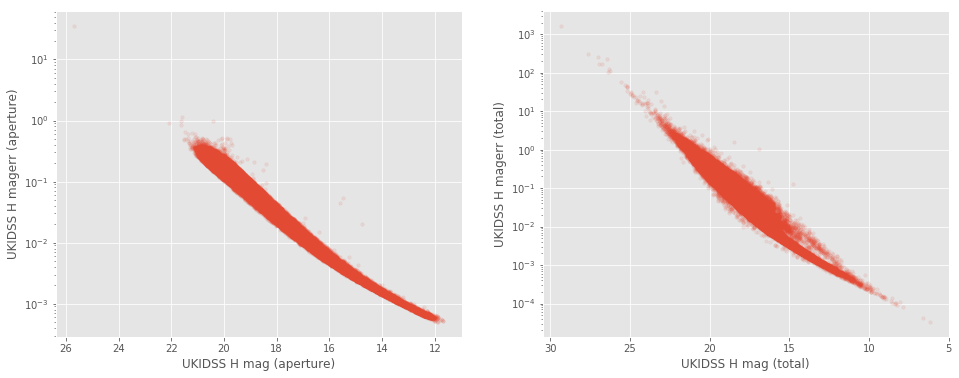

VHS K mag (aperture)
    Error max: 176
    magerr > 10: Number of objects = 1, min mag = 25.0
    magerr > 100: Number of objects = 1, min mag = 25.0
    magerr > 1000: Number of objects = 0, min mag = nan

VHS K mag (total)
    Error max: 408
    magerr > 10: Number of objects = 45, min mag = 21.9
    magerr > 100: Number of objects = 3, min mag = 26.9
    magerr > 1000: Number of objects = 0, min mag = nan



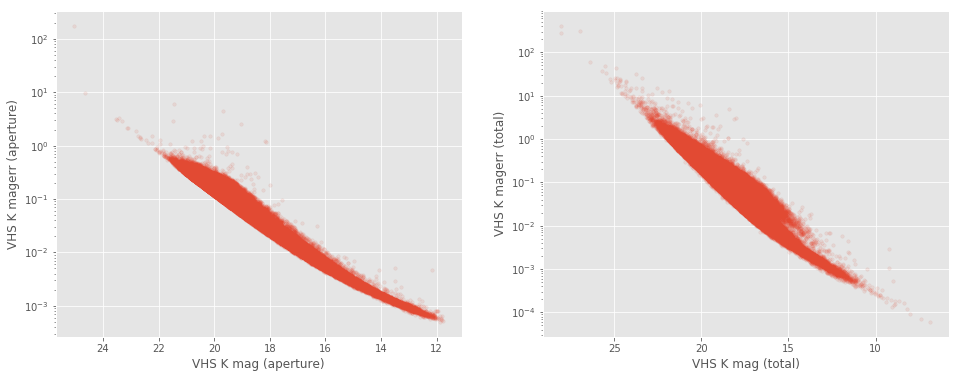

UKIDSS K mag (aperture)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS K mag (total)
    Error max: 406
    magerr > 10: Number of objects = 82, min mag = 23.3
    magerr > 100: Number of objects = 9, min mag = 26.2
    magerr > 1000: Number of objects = 0, min mag = nan



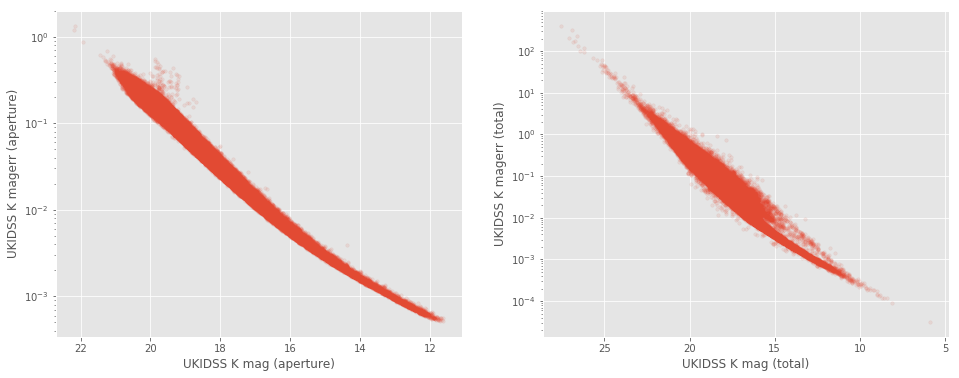

VICS82 K mag (aperture)
No sources have VICS82 K mag (aperture) values.

VICS82 K mag (total)
No sources have VICS82 K mag (total) values.



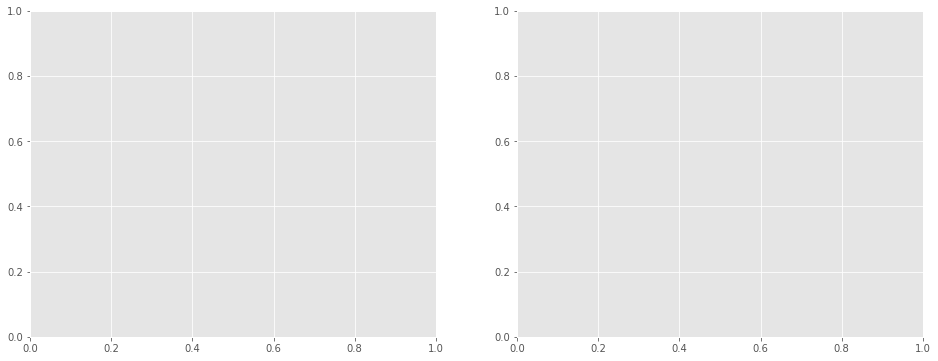

IRAC i1 mag (aperture)
    Error max: 398
    magerr > 10: Number of objects = 72, min mag = 20.1
    magerr > 100: Number of objects = 6, min mag = 21.5
    magerr > 1000: Number of objects = 0, min mag = nan

IRAC i1 mag (total)
    Error max: 2823
    magerr > 10: Number of objects = 209, min mag = 16.6
    magerr > 100: Number of objects = 12, min mag = 20.5
    magerr > 1000: Number of objects = 1, min mag = 20.5



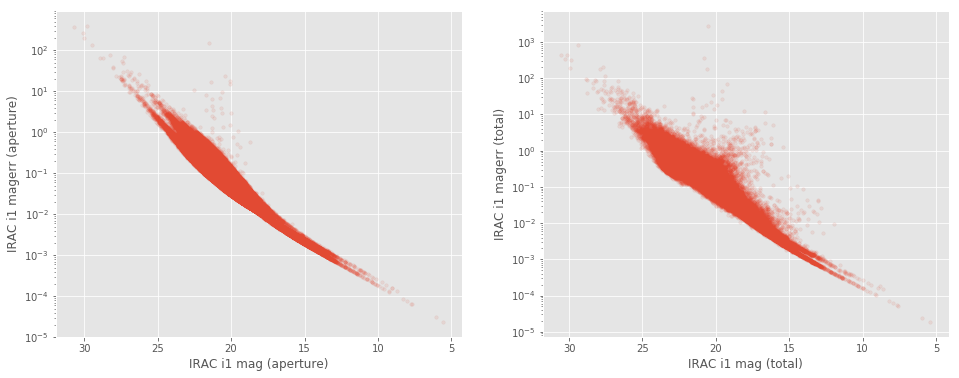

IRAC i2 mag (aperture)
    Error max: 8748
    magerr > 10: Number of objects = 77, min mag = 21.3
    magerr > 100: Number of objects = 8, min mag = 29.3
    magerr > 1000: Number of objects = 1, min mag = 34.0

IRAC i2 mag (total)
    Error max: 3039
    magerr > 10: Number of objects = 184, min mag = 17.2
    magerr > 100: Number of objects = 20, min mag = 21.8
    magerr > 1000: Number of objects = 3, min mag = 30.5



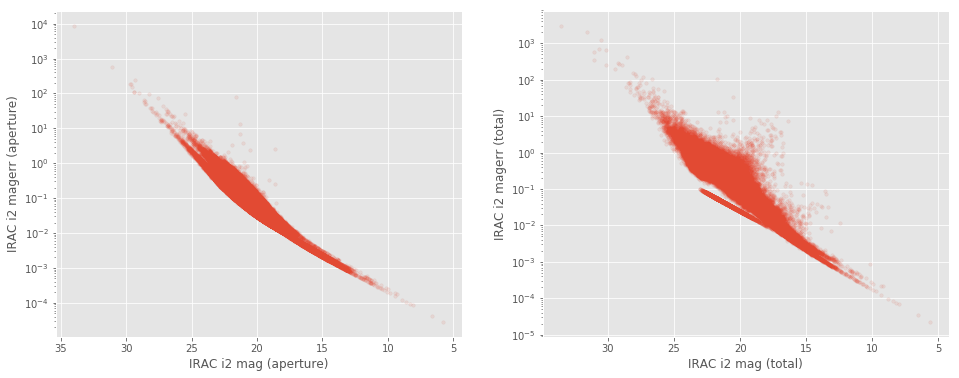

In [10]:
for mag in all_mags:

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
        
    basecol = mag.replace(" ", "_").lower()
    
    #if basecol == "omegacam_u":
    if basecol == "suprime_r" or basecol == "sdss_g":
        savefig = True
    else:
        savefig=False
        
    col, ecol = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax1,
               labels=("{} mag (aperture)".format(mag), "{} magerr (aperture)".format(mag)), savefig=False)

    
    col, ecol = "m_{}".format(basecol), "merr_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax2,
               labels=("{} mag (total)".format(mag), "{} magerr (total)".format(mag)), savefig=savefig)
    
    display(fig)
    plt.close()


## 2. Magnitude and error issues

In [14]:
def flag_mag(mask, x1, y1, x2, y2, mask2=None, x3=None, y3=None,  
             labels1=("x", "y"), labels2=("x", "y"), labels3=("x", "y"), nb=2,
             savefig=False):

    if nb == 2:
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    else:
        fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))
    
    # mag vs magerr
    ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax1.scatter(x1, y1, marker='.', alpha=0.1, s=50)
    ax1.plot(x1[mask], y1[mask], 'b.')
    if mask2 is not None:
        ax1.plot(x1[mask2], y1[mask2], 'g.')
    ax1.invert_xaxis()
    ax1.set_xlabel(labels1[0])
    ax1.set_ylabel(labels1[1])
    
    # Comparing magnitudes
    ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
    ax2.plot(x2[mask], y2[mask], 'b.')
    if mask2 is not None:
        ax2.plot(x2[mask2], y2[mask2], 'g.')
    ax2.invert_xaxis()
    ax2.invert_yaxis()
    ax2.set_xlabel(labels2[0])
    ax2.set_ylabel(labels2[1])
    
    if nb >= 3:
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask], y3[mask], 'b.')
        if mask2 is not None:
            ax3.plot(x3[mask2], y3[mask2], 'g.')
        ax3.invert_xaxis()
        ax3.invert_yaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Save ex. fig
    if savefig:
        survey_label = ((labels1[0].replace(" ", "_")).replace("(", "")).replace(")", "")
        if "GPC1 " in labels1[0]:
            figname = field + "_gpc1Issues_" + survey_label + ".png"
        elif "DECam" in labels1[0]:
            figname = field + "_decamIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
        
    display(fig)
    plt.close()


### 2.a Pan-STARRS Aperture and Total magnitudes

GPC1 g
   Number of flagged objects: 421


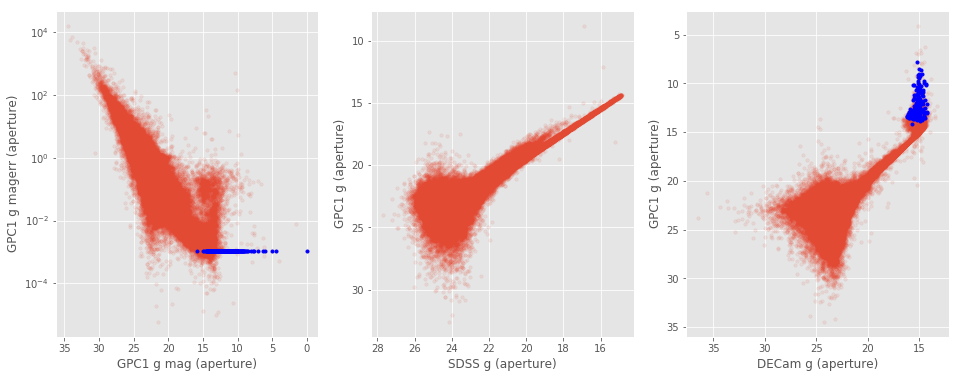

GPC1 r
   Number of flagged objects: 557


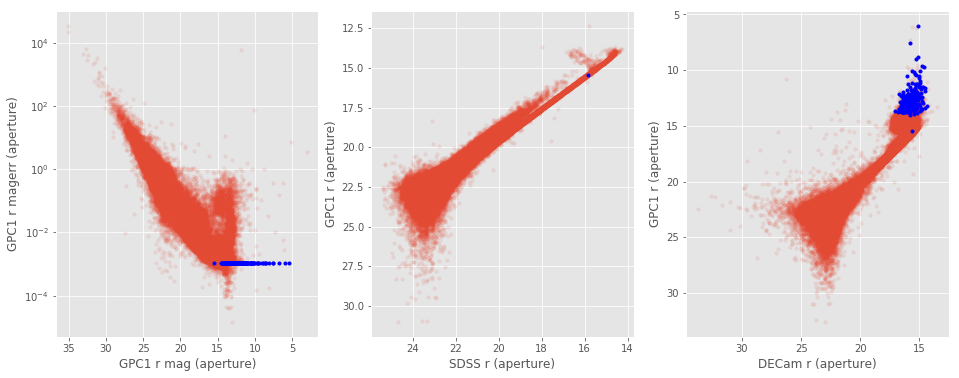

GPC1 i
   Number of flagged objects: 458


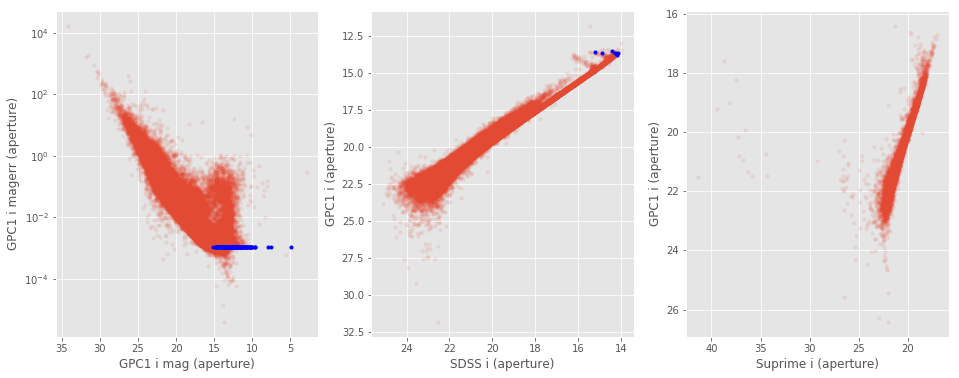

GPC1 z
   Number of flagged objects: 534


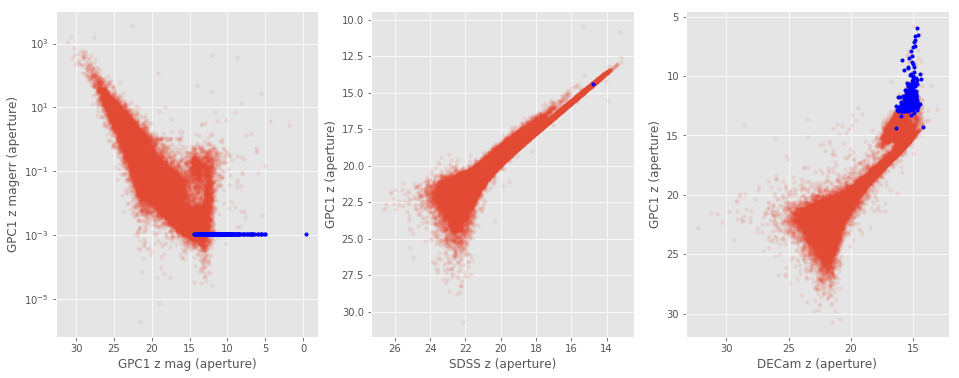

GPC1 y
   Number of flagged objects: 238


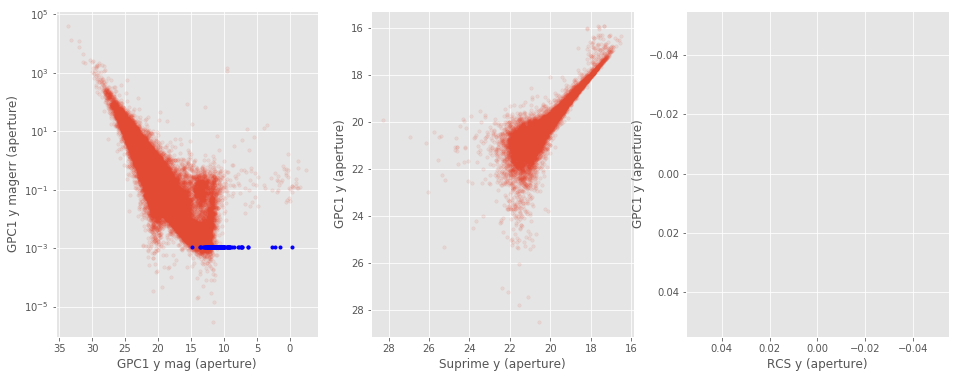

In [16]:
ps1_err = 0.0010860000038519502
bands = ['g', 'r', 'i', 'z', 'y']

for i, surveys in enumerate([g_bands, r_bands, i_bands, z_bands, y_bands]):
    surveys.insert(0, surveys.pop(surveys.index('GPC1 '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
    ecol1 = "merr_ap_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_ap_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (aperture)".format(surveys[2]), "{} (aperture)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'gpc1_r':
        savefig = True
    else:
        savefig = False

        
    mask = np.where(master_catalogue[ecol1] == ps1_err)
    print ('   Number of flagged objects:', len(master_catalogue[ecol1][mask]))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                    master_catalogue[col2], master_catalogue[col1], 
                    x3=x3, y3=y3,
                    labels1=("{} mag (aperture)".format(surveys[0]), "{} magerr (aperture)".format(surveys[0])),
                    labels2=("{} (aperture)".format(surveys[1]), "{} (aperture)".format(surveys[0])),
                    labels3=labels3, nb=len(surveys), savefig=savefig)

### 2.b. DECaLS total magnitudes

DECam g
   Number of flagged objects (m=14.999935): 3
   Number of flagged objects (m < 7 (and m=0)): 0 (0)


/data/vault/epons/conda_envs/herschelhelp_internal/lib/python3.6/site-packages/astropy/table/column.py:929: RuntimeWarning: invalid value encountered in less
  return getattr(self.data, oper)(other)


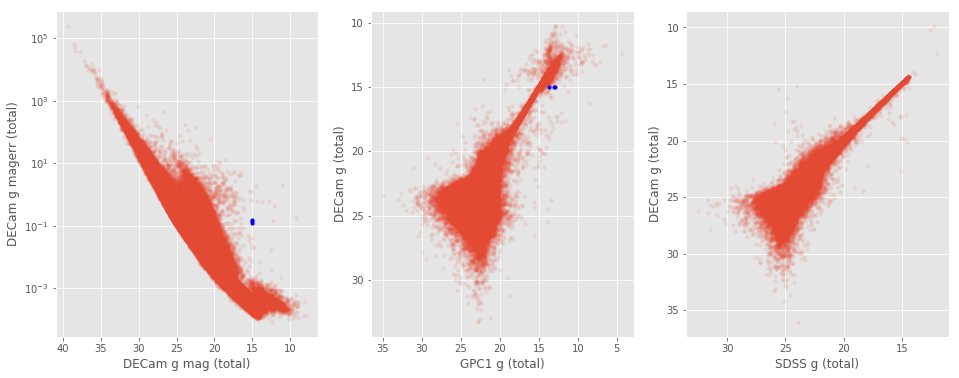

DECam r
   Number of flagged objects (m=14.999935): 0
   Number of flagged objects (m < 7 (and m=0)): 2 (0)


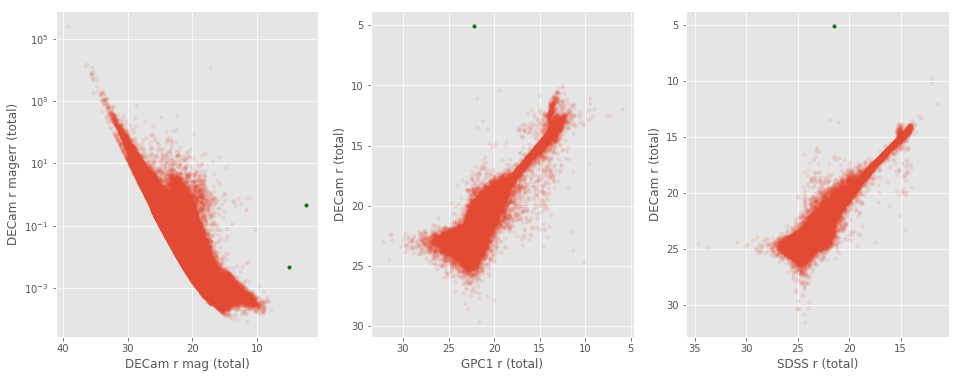

DECam z
   Number of flagged objects (m=14.999935): 3
   Number of flagged objects (m < 7 (and m=0)): 1 (0)


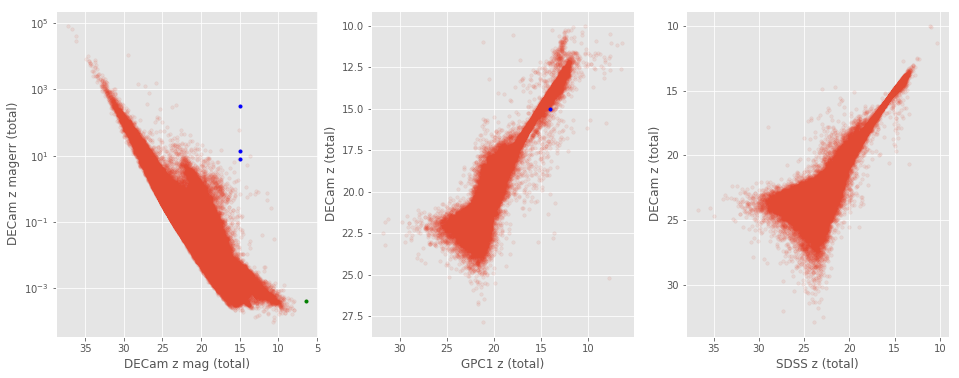

In [18]:
bands = ['g', 'r', 'z']

for i, surveys in enumerate([g_bands, r_bands, z_bands]):
    surveys.insert(0, surveys.pop(surveys.index('DECam '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
    ecol1 = "merr_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (total)".format(surveys[2]), "{} (total)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'decam_z':
        savefig = True
    else:
        savefig = False

    def cstr(s, color=34):
        # ANSI color: red: color=31, blue: color=34, green:color=32
        return "\x1b[{}m{}\x1b[0m".format(color, s)


    mask = (master_catalogue[col1] == 14.999935)
    print ('   Number of flagged objects ({}): {}'.format(cstr('m=14.999935'), len(master_catalogue[ecol1][mask])))
    mask2 = (master_catalogue[col1] < 7)
    mag0 = (master_catalogue[col1] < 0)
    print('   Number of flagged objects ({}): {} ({})'.format(cstr('m < 7 (and m=0)', color=32),\
                                                                           len(master_catalogue[ecol1][mask2]),\
                                                                           len(master_catalogue[ecol1][mag0])))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                   master_catalogue[col2], master_catalogue[col1], 
                   x3=x3, y3=y3, mask2=mask2, 
                   labels1=("{} mag (total)".format(surveys[0]), "{} magerr (total)".format(surveys[0])),
                   labels2=("{} (total)".format(surveys[1]), "{} (total)".format(surveys[0])),
                   labels3=labels3, nb=len(surveys), savefig=savefig)

## 3/ Outliers

$$chi^2 = \frac{(mag_{1}-mag_{2})^2}{magerr_{1}^2 + magerr_{2}^2}$$ 
<br>
__Interquartile range (IQR) and outliers:__<br>
We consider as outliers objects which have a high $chi^2$, about $5\sigma$ away from the mean.<br>
$25th, 75th \;percentile = 0.6745\sigma$<br>
$IQR = (75th \;percentile - 25th \;percentile) = 0.6745\sigma * 2 = 1.349\sigma$<br>
$75th \;percentile + 3.2\times IQR = 0.6745\sigma + 3.2\times1.349\sigma = 4.7\sigma$
<br><br>
$$outliers == [chi^2 >  (75th \;percentile + 3.2\times (75th \;percentile - 25th \;percentile))]$$
<br><br>
__NB:__<br>
Bright sources tend to have their errors underestimated with values as low as $10^{-6}$, which is unrealistic. So to avoid high $chi^2$ due to unrealistic small errors, we clip the error to get a minimum value of 0.1% (i.e. all errors smaller then $10^{-3}$ are set to $10^{-3}$).

In [19]:
def outliers(x, y, xerr, yerr, labels=["x", "y"], savefig=False):
    
    import matplotlib
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    xerr = np.copy(xerr[mask])
    yerr = np.copy(yerr[mask])
    
    # mag1 - mag2
    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    # Set the minimum error to 10^-3
    np.clip(xerr, 1e-3, np.max(xerr), out=xerr)
    np.clip(yerr, 1e-3, np.max(yerr), out=yerr)

    # Median, Median absolute deviation and 1% and 99% percentiles
    diff_median = np.median(diff)
    diff_mad = np.median(np.abs(diff - diff_median))
    diff_1p, diff_99p = np.percentile(diff, [1., 99.])
    diff_25p, diff_75p = np.percentile(diff, [25., 75.])
    
    
    diff_label = "{} - {}".format(y_label, x_label)

    print("{} ({} sources):".format(diff_label, len(x)))
    print("- Median: {:.2f}".format(diff_median))
    print("- Median Absolute Deviation: {:.2f}".format(diff_mad))
    print("- 1% percentile: {}".format(diff_1p))
    print("- 99% percentile: {}".format(diff_99p))

    
    # Chi2 (Normalized difference)   
    ichi2 = np.power(diff, 2) / (np.power(xerr, 2) + np.power(yerr, 2))
    
    # Use only non-null values of ichi2
    mask2 = ichi2 != 0.0
    diff, ichi2 = np.copy(diff[mask2]), np.copy(ichi2[mask2])
    x, y, xerr, yerr = np.copy(x[mask2]), np.copy(y[mask2]), np.copy(xerr[mask2]), np.copy(yerr[mask2])

    # Outliers (5sigma)
    log_ichi2_25p, log_ichi2_75p = np.percentile(np.log10(ichi2), [25., 75.])
    out_lim = log_ichi2_75p + 3.2*abs(log_ichi2_25p-log_ichi2_75p)
    
    outliers = np.log10(ichi2) > out_lim 
    nb_outliers = len(x[outliers])
    
    print("Outliers separation: log(chi2) = {:.2f}".format(out_lim))
    print("Number of outliers: {}".format(nb_outliers))

    print("")

    # Comparing mag
    ax1.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax1.scatter(x[outliers], y[outliers], marker='.', c='b', alpha=0.3, s=50, label='Outliers ({})'.format(nb_outliers))
    min_val = np.min(np.r_[x, y])
    max_val = np.max(np.r_[x, y])
    ax1.autoscale(False)
    ax1.plot([min_val, max_val], [min_val, max_val], "k:")
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.legend(loc='lower right', numpoints=1)
    

    # Chi2 vs Diff
    #ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax2.scatter(diff, np.log10(ichi2), marker='.', alpha=0.1, s=50)
    if nb_outliers != 0:
        ax2.scatter(diff[outliers], np.log10(ichi2[outliers]), marker='.', alpha=0.3, s=50, color='b',\
                    label='Outliers ({})'.format(nb_outliers))
    ax2.axhline(out_lim, color='grey', linestyle=':')
    ax2.set_xlabel(diff_label)
    ax2.set_ylabel('log(chi2)')
    ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(np.log10(ichi2), ax=ax3, bins='knuth', facecolor='red', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    if nb_outliers > 3:
        n, bins, patches = vz.hist(np.log10(ichi2[outliers]), ax=ax3, bins='knuth', facecolor='b', lw = 2, alpha=0.7,\
                                   orientation="horizontal")
    ax3.axhline(out_lim, color='grey', linestyle=':')
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_outliers_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

GPC1 g (aperture) - DECam g (aperture) (462946 sources):
- Median: -0.12
- Median Absolute Deviation: 0.28
- 1% percentile: -3.1324508666992186
- 99% percentile: 2.209981250762938
Outliers separation: log(chi2) = 5.36
Number of outliers: 964



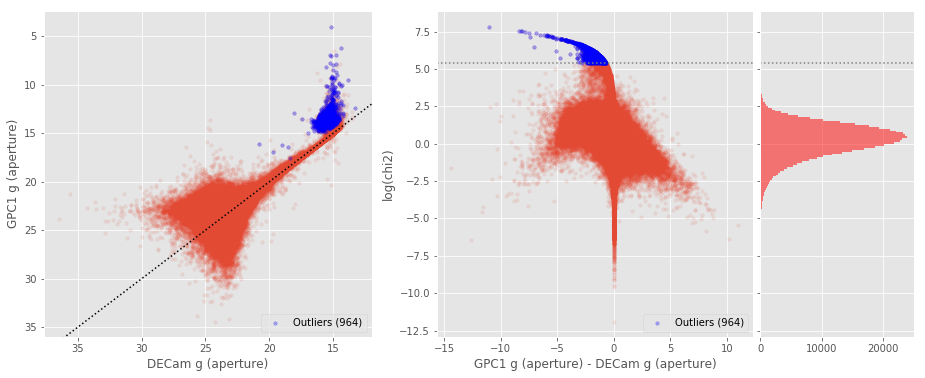

GPC1 g (total) - DECam g (total) (463902 sources):
- Median: -0.02
- Median Absolute Deviation: 0.28
- 1% percentile: -3.503301296234131
- 99% percentile: 1.7441903114318813
Outliers separation: log(chi2) = 5.34
Number of outliers: 150



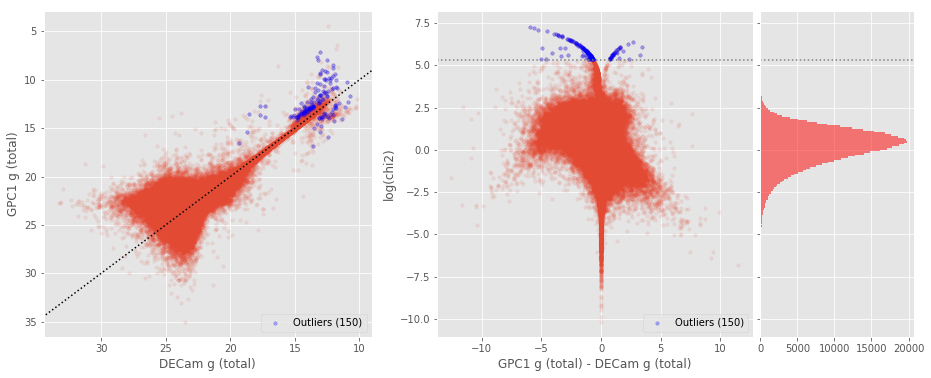

SDSS g (aperture) - DECam g (aperture) (472123 sources):
- Median: 0.65
- Median Absolute Deviation: 0.21
- 1% percentile: -1.1470082854003918
- 99% percentile: 1.3697434157714832
Outliers separation: log(chi2) = 5.81
Number of outliers: 2



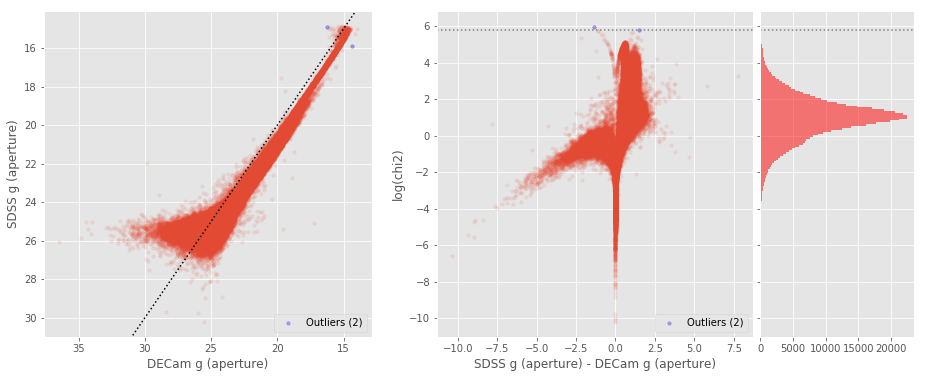

SDSS g (total) - DECam g (total) (474023 sources):
- Median: -0.03
- Median Absolute Deviation: 0.18
- 1% percentile: -1.6710442353515633
- 99% percentile: 0.8870277509765592
Outliers separation: log(chi2) = 4.27
Number of outliers: 60



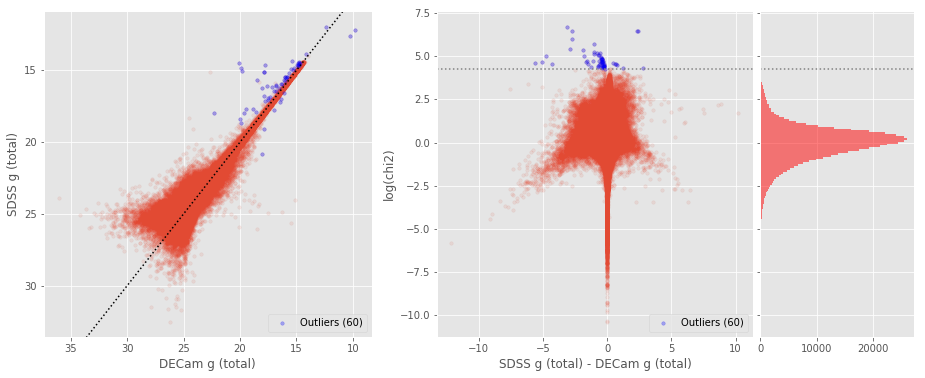

Suprime g (aperture) - DECam g (aperture) (61679 sources):
- Median: 0.02
- Median Absolute Deviation: 0.23
- 1% percentile: -2.4182591247558594
- 99% percentile: 1.8705764389038144
Outliers separation: log(chi2) = 4.32
Number of outliers: 50



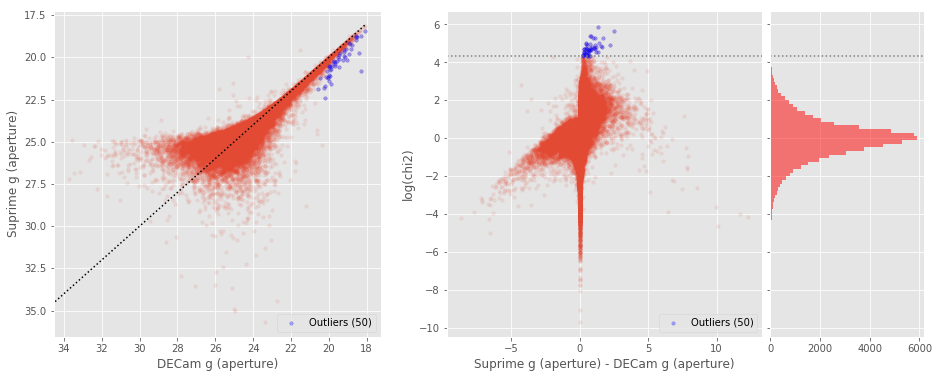

Suprime g (total) - DECam g (total) (60588 sources):
- Median: -0.15
- Median Absolute Deviation: 0.24
- 1% percentile: -2.546414394378662
- 99% percentile: 1.5885706520080562
Outliers separation: log(chi2) = 4.06
Number of outliers: 90



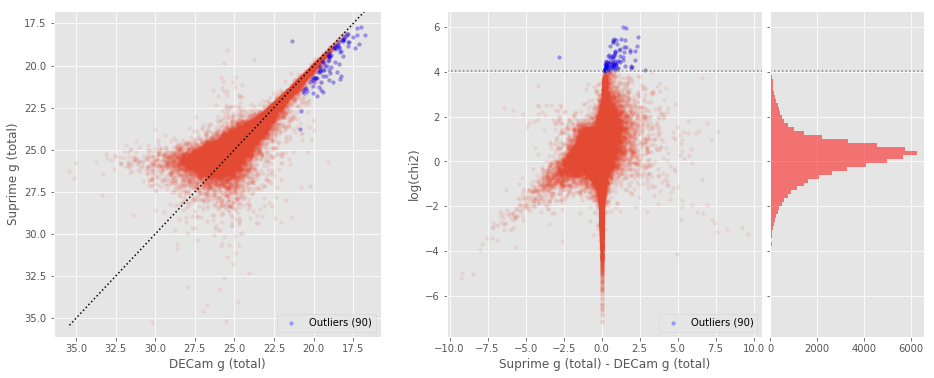

No sources have both DECam g (aperture) and RCS g (aperture) values.

RCS g (total) - DECam g (total) (461303 sources):
- Median: -0.22
- Median Absolute Deviation: 0.21
- 1% percentile: -2.1725115966796875
- 99% percentile: 0.9619197845458984
Outliers separation: log(chi2) = 4.73
Number of outliers: 28



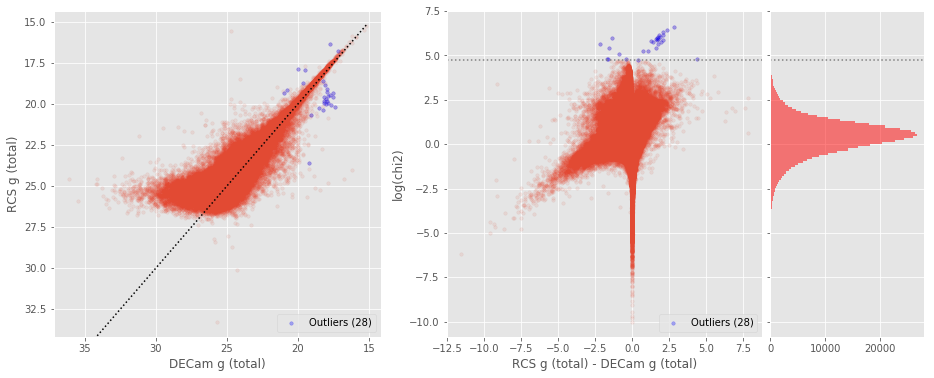

SDSS g (aperture) - GPC1 g (aperture) (136867 sources):
- Median: 0.91
- Median Absolute Deviation: 0.37
- 1% percentile: -1.5728337866821278
- 99% percentile: 3.206002183227538
Outliers separation: log(chi2) = 6.60
Number of outliers: 0



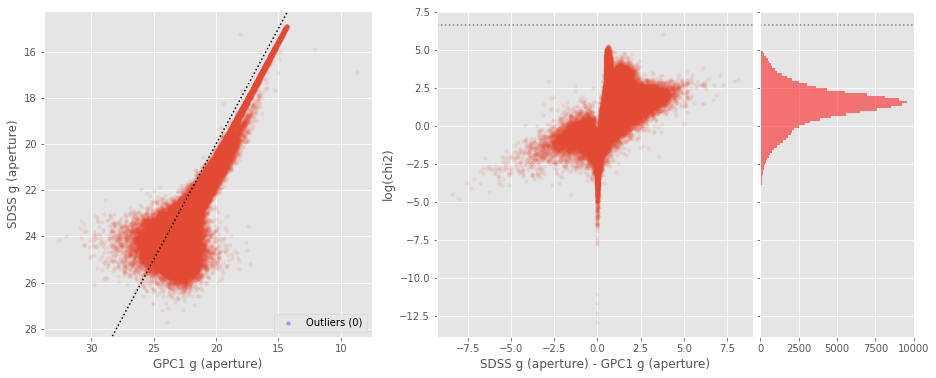

SDSS g (total) - GPC1 g (total) (137325 sources):
- Median: 0.07
- Median Absolute Deviation: 0.26
- 1% percentile: -1.655127963500976
- 99% percentile: 2.88015255749512
Outliers separation: log(chi2) = 5.26
Number of outliers: 1



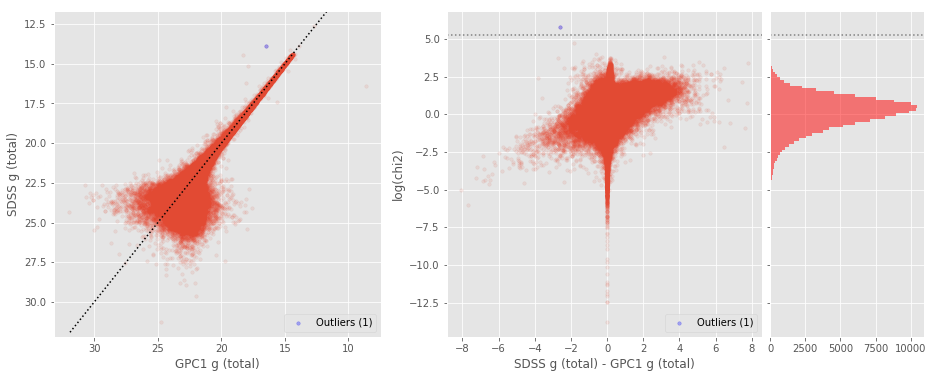

Suprime g (aperture) - GPC1 g (aperture) (11222 sources):
- Median: 0.25
- Median Absolute Deviation: 0.30
- 1% percentile: -1.9736169052124022
- 99% percentile: 2.9869889640808087
Outliers separation: log(chi2) = 6.12
Number of outliers: 0



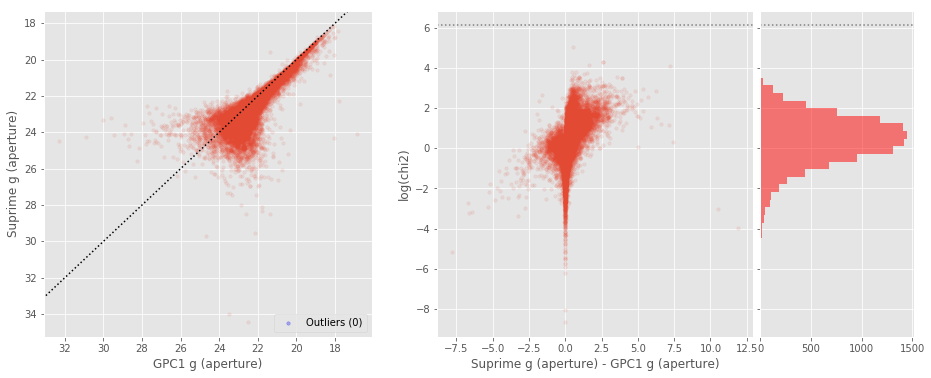

Suprime g (total) - GPC1 g (total) (11218 sources):
- Median: 0.12
- Median Absolute Deviation: 0.29
- 1% percentile: -1.4026131439208984
- 99% percentile: 3.274006023406982
Outliers separation: log(chi2) = 5.38
Number of outliers: 0



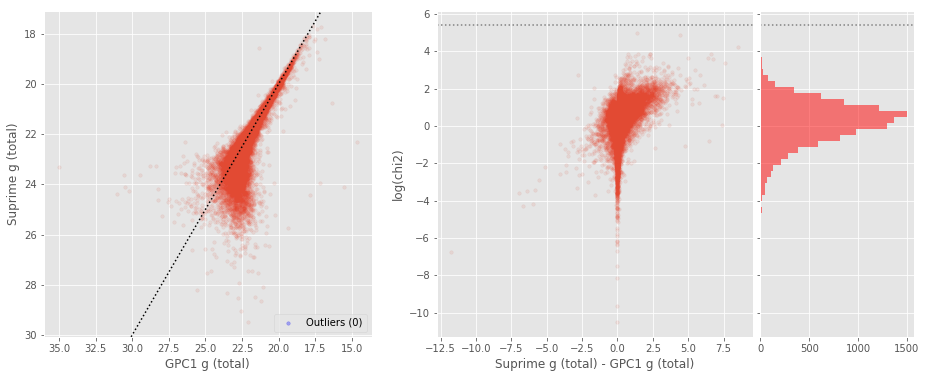

No sources have both GPC1 g (aperture) and RCS g (aperture) values.

RCS g (total) - GPC1 g (total) (127657 sources):
- Median: -0.13
- Median Absolute Deviation: 0.32
- 1% percentile: -1.882863235473633
- 99% percentile: 2.9682432556152345
Outliers separation: log(chi2) = 5.62
Number of outliers: 0



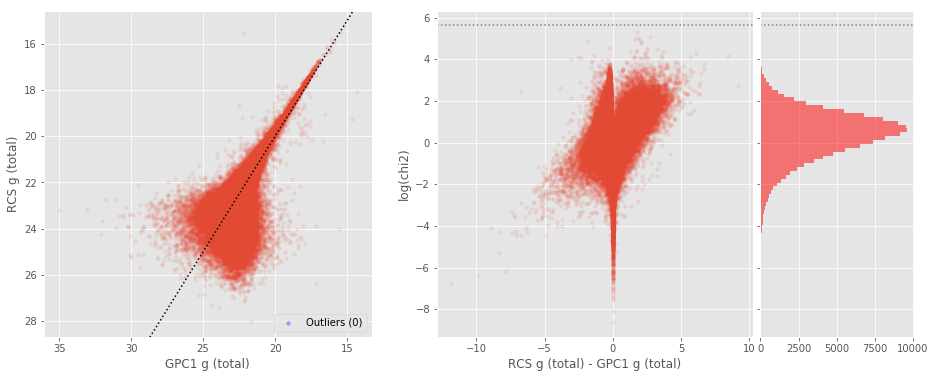

No sources have both SDSS g (aperture) and Suprime g (aperture) values.

No sources have both SDSS g (total) and Suprime g (total) values.

No sources have both SDSS g (aperture) and RCS g (aperture) values.

RCS g (total) - SDSS g (total) (120286 sources):
- Median: -0.15
- Median Absolute Deviation: 0.20
- 1% percentile: -1.1508145864868167
- 99% percentile: 1.2041443676757795
Outliers separation: log(chi2) = 4.67
Number of outliers: 16



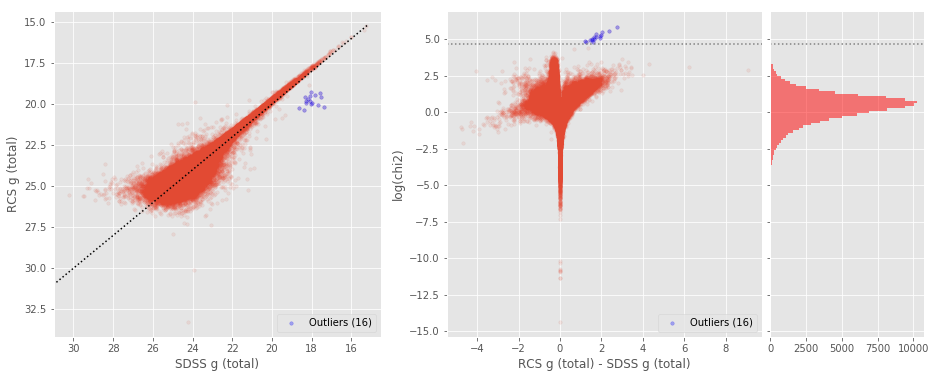

No sources have both Suprime g (aperture) and RCS g (aperture) values.

RCS g (total) - Suprime g (total) (64765 sources):
- Median: -0.15
- Median Absolute Deviation: 0.21
- 1% percentile: -2.40746826171875
- 99% percentile: 1.0876546478271485
Outliers separation: log(chi2) = 5.96
Number of outliers: 0



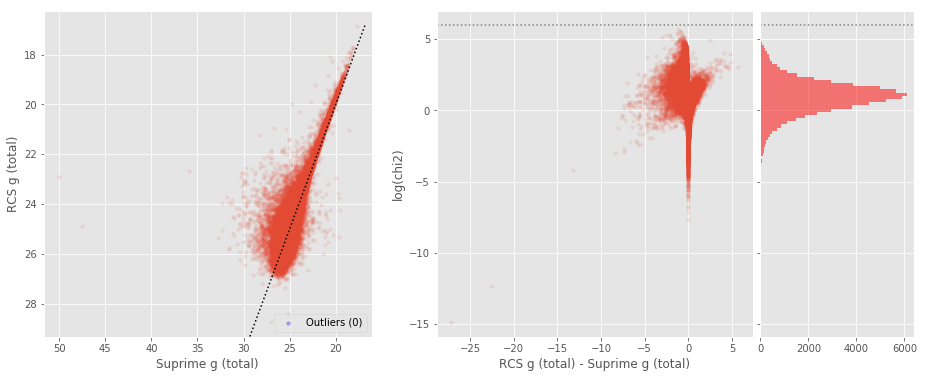

GPC1 r (aperture) - DECam r (aperture) (487238 sources):
- Median: 0.12
- Median Absolute Deviation: 0.15
- 1% percentile: -1.838051061630249
- 99% percentile: 1.5183926773071295
Outliers separation: log(chi2) = 5.06
Number of outliers: 4270



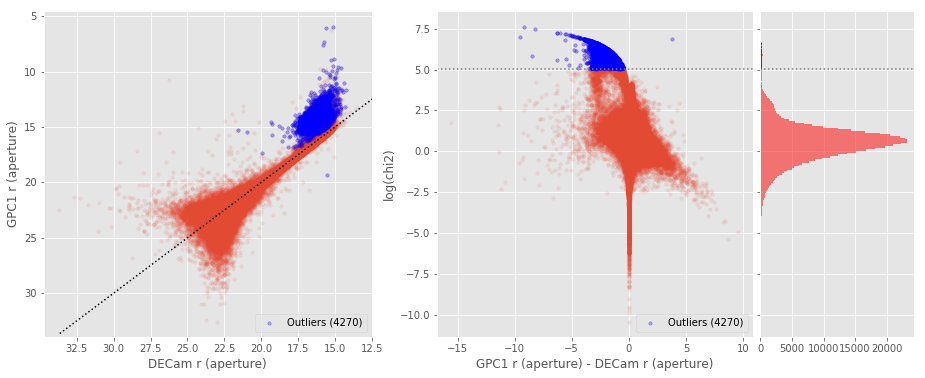

GPC1 r (total) - DECam r (total) (487791 sources):
- Median: 0.23
- Median Absolute Deviation: 0.15
- 1% percentile: -1.316351318359375
- 99% percentile: 1.4407266616821286
Outliers separation: log(chi2) = 5.75
Number of outliers: 79



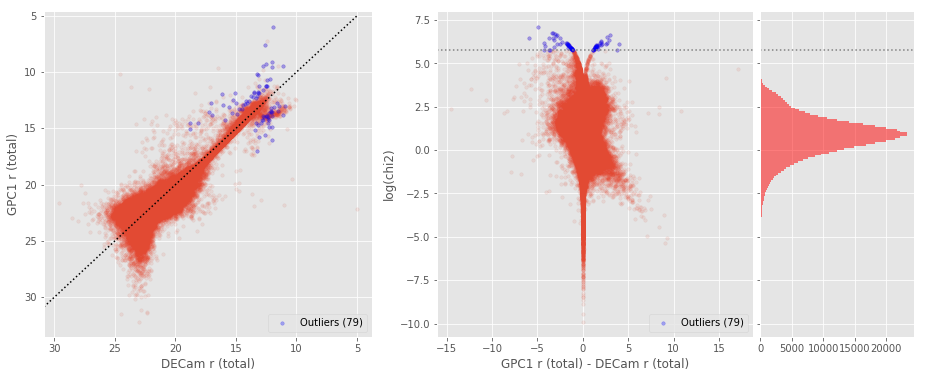

SDSS r (aperture) - DECam r (aperture) (471619 sources):
- Median: 0.68
- Median Absolute Deviation: 0.21
- 1% percentile: -1.110101314331055
- 99% percentile: 1.3852449727783218
Outliers separation: log(chi2) = 6.75
Number of outliers: 0



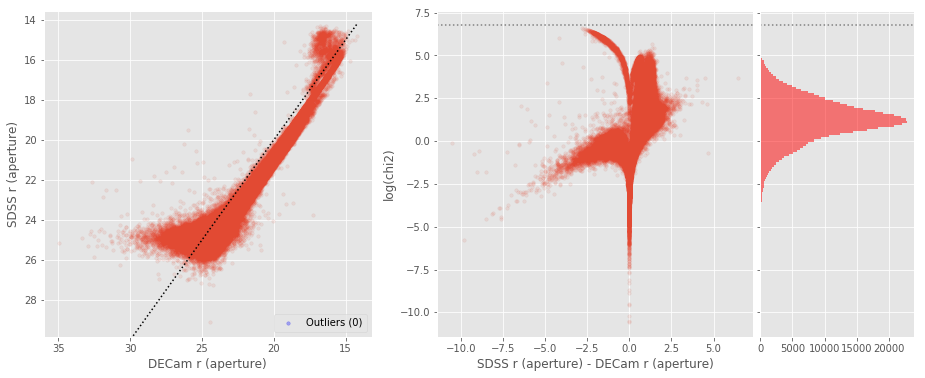

SDSS r (total) - DECam r (total) (474990 sources):
- Median: 0.13
- Median Absolute Deviation: 0.15
- 1% percentile: -0.9778500347900377
- 99% percentile: 1.045752802978513
Outliers separation: log(chi2) = 4.93
Number of outliers: 127



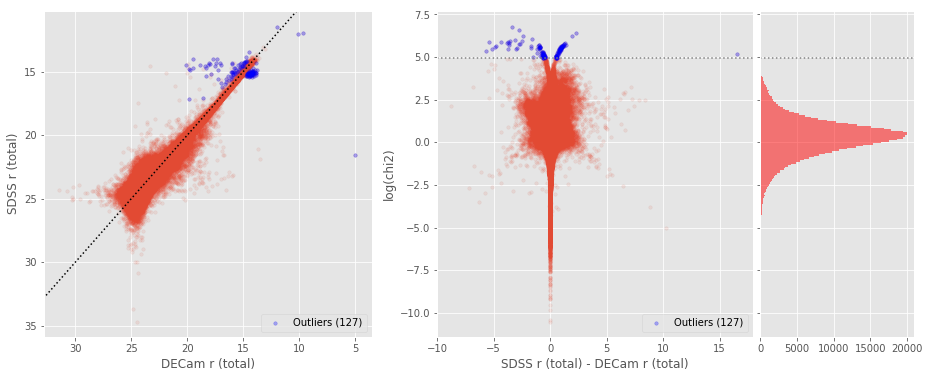

Suprime r (aperture) - DECam r (aperture) (63294 sources):
- Median: 0.11
- Median Absolute Deviation: 0.21
- 1% percentile: -2.228728008270264
- 99% percentile: 1.4809819793701173
Outliers separation: log(chi2) = 5.69
Number of outliers: 1



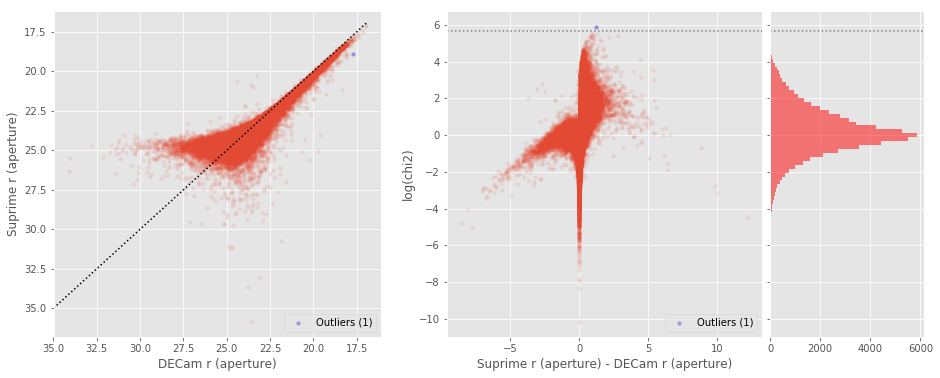

Suprime r (total) - DECam r (total) (63305 sources):
- Median: 0.01
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1619326782226564
- 99% percentile: 1.5908895874023425
Outliers separation: log(chi2) = 4.90
Number of outliers: 42



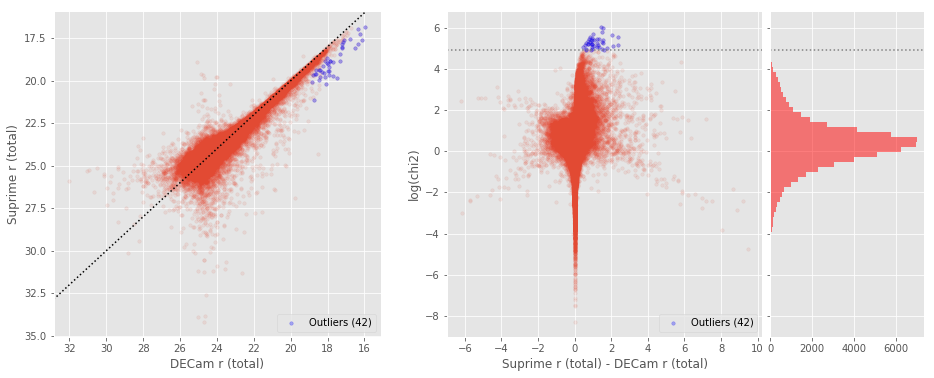

No sources have both DECam r (aperture) and RCS r (aperture) values.

RCS r (total) - DECam r (total) (545242 sources):
- Median: -0.01
- Median Absolute Deviation: 0.17
- 1% percentile: -1.0698253631591799
- 99% percentile: 1.1014166641235348
Outliers separation: log(chi2) = 5.09
Number of outliers: 21



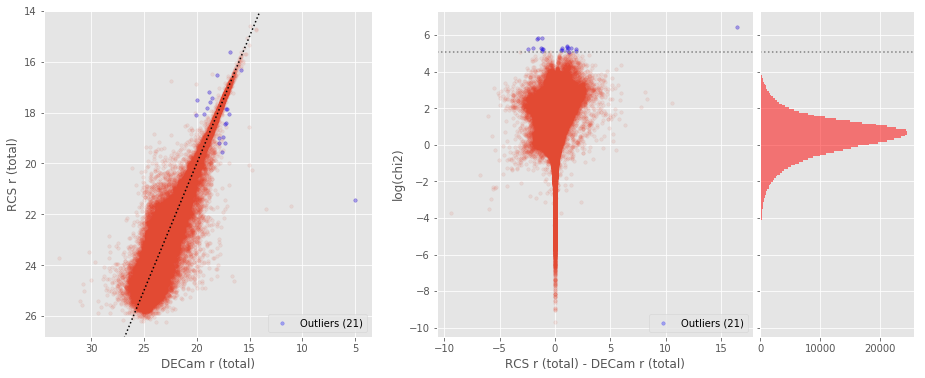

SDSS r (aperture) - GPC1 r (aperture) (143469 sources):
- Median: 0.65
- Median Absolute Deviation: 0.24
- 1% percentile: -0.7977198767089848
- 99% percentile: 1.6492644418945321
Outliers separation: log(chi2) = 6.55
Number of outliers: 0



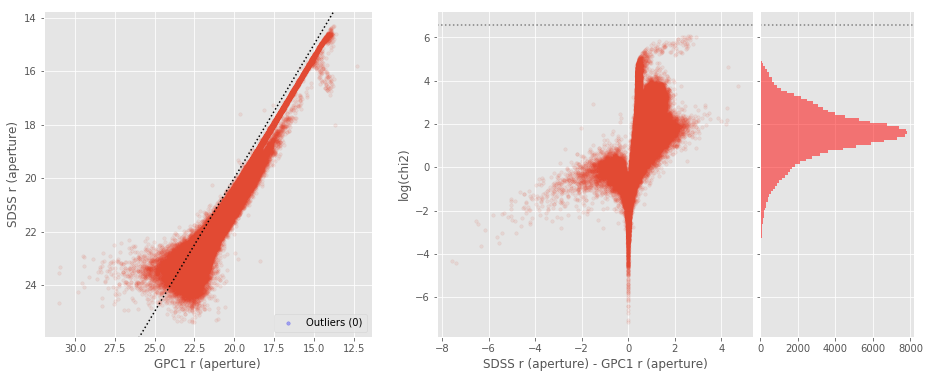

SDSS r (total) - GPC1 r (total) (143519 sources):
- Median: -0.09
- Median Absolute Deviation: 0.12
- 1% percentile: -1.0046281422119128
- 99% percentile: 1.1506107810668973
Outliers separation: log(chi2) = 4.92
Number of outliers: 26



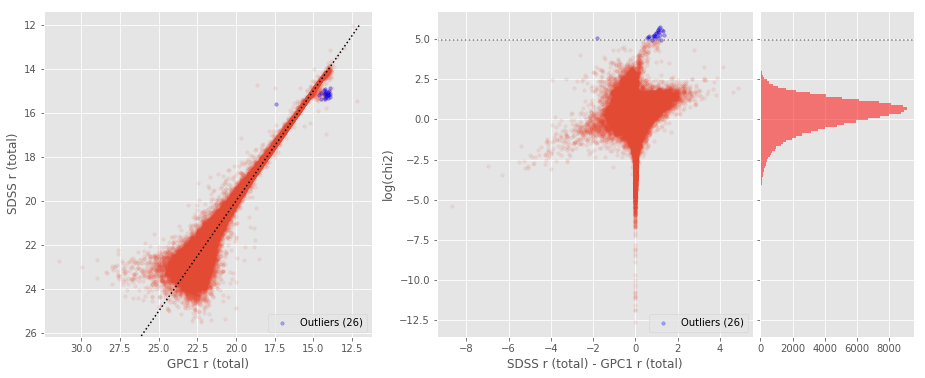

Suprime r (aperture) - GPC1 r (aperture) (11604 sources):
- Median: 0.07
- Median Absolute Deviation: 0.15
- 1% percentile: -1.3094873237609863
- 99% percentile: 1.4882897758483766
Outliers separation: log(chi2) = 5.21
Number of outliers: 0



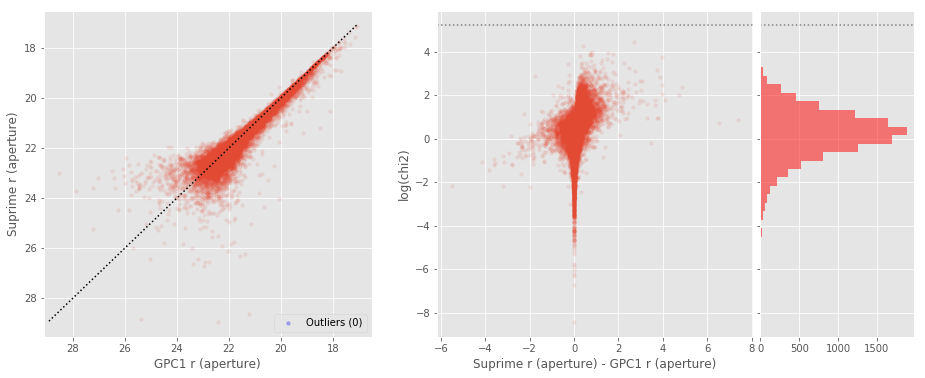

Suprime r (total) - GPC1 r (total) (11567 sources):
- Median: -0.11
- Median Absolute Deviation: 0.14
- 1% percentile: -0.9736609268188476
- 99% percentile: 1.6416873550415039
Outliers separation: log(chi2) = 4.78
Number of outliers: 1



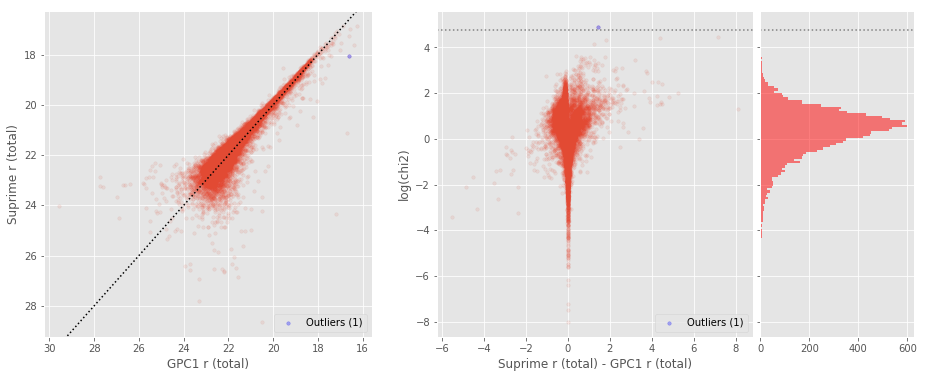

No sources have both GPC1 r (aperture) and RCS r (aperture) values.

RCS r (total) - GPC1 r (total) (160288 sources):
- Median: -0.23
- Median Absolute Deviation: 0.14
- 1% percentile: -1.1326136779785156
- 99% percentile: 1.4416136932373051
Outliers separation: log(chi2) = 5.41
Number of outliers: 0



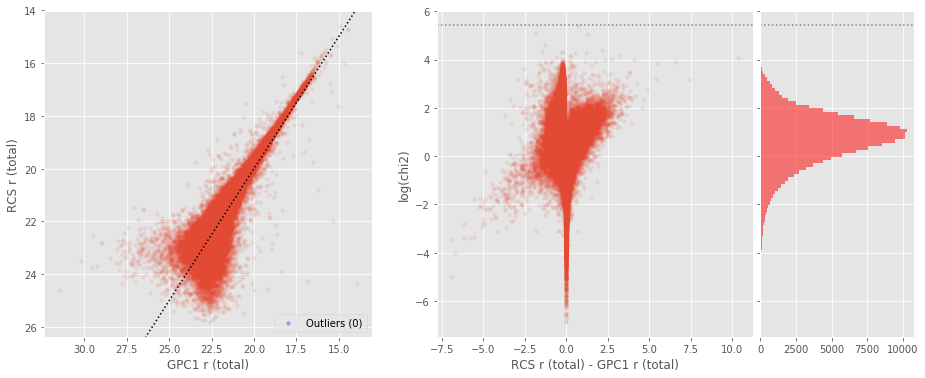

No sources have both SDSS r (aperture) and Suprime r (aperture) values.

No sources have both SDSS r (total) and Suprime r (total) values.

No sources have both SDSS r (aperture) and RCS r (aperture) values.

RCS r (total) - SDSS r (total) (137585 sources):
- Median: -0.12
- Median Absolute Deviation: 0.15
- 1% percentile: -1.019848545166015
- 99% percentile: 1.0965001182861318
Outliers separation: log(chi2) = 4.74
Number of outliers: 0



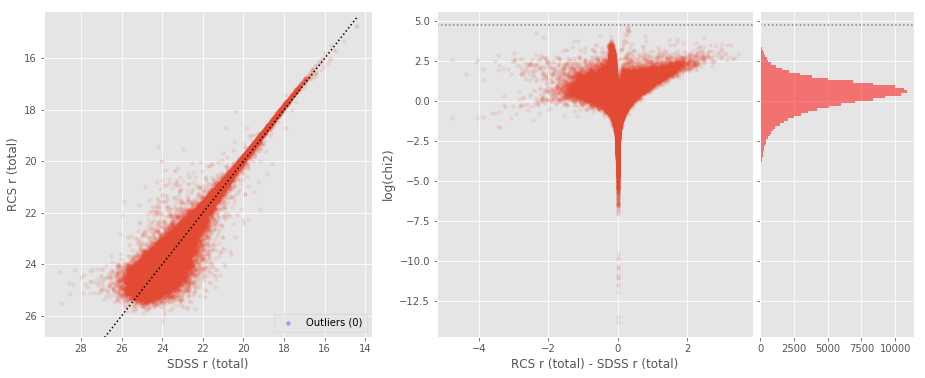

No sources have both Suprime r (aperture) and RCS r (aperture) values.

RCS r (total) - Suprime r (total) (73481 sources):
- Median: -0.07
- Median Absolute Deviation: 0.18
- 1% percentile: -2.3652862548828124
- 99% percentile: 1.0521179199218729
Outliers separation: log(chi2) = 5.93
Number of outliers: 1



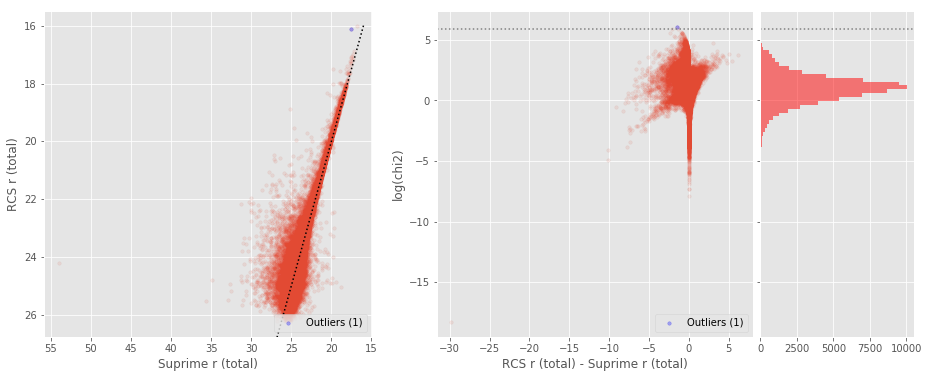

SDSS i (aperture) - GPC1 i (aperture) (144335 sources):
- Median: 0.57
- Median Absolute Deviation: 0.18
- 1% percentile: -0.2038665410156258
- 99% percentile: 1.290400276611329
Outliers separation: log(chi2) = 6.49
Number of outliers: 0



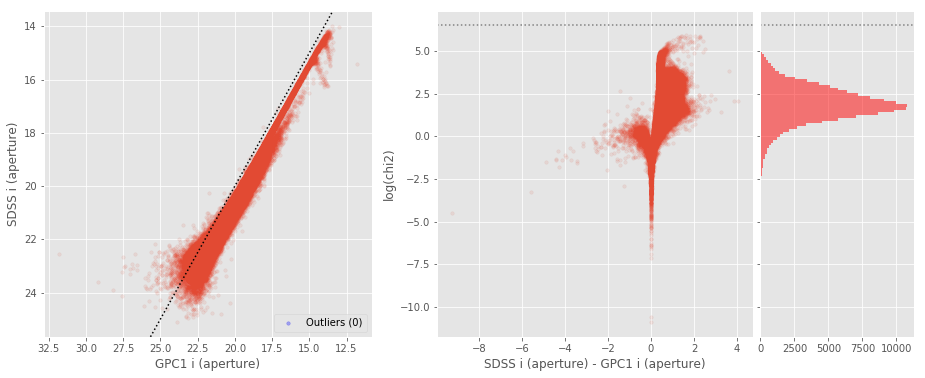

SDSS i (total) - GPC1 i (total) (144324 sources):
- Median: -0.11
- Median Absolute Deviation: 0.09
- 1% percentile: -0.7460765848388674
- 99% percentile: 0.5160627268371533
Outliers separation: log(chi2) = 4.84
Number of outliers: 18



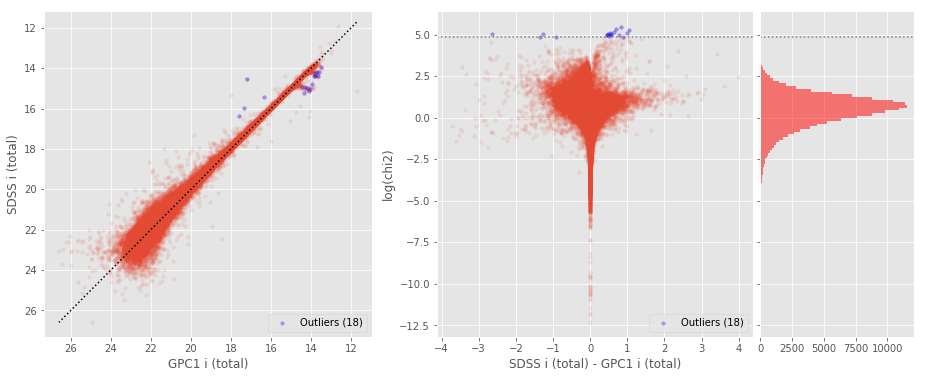

Suprime i (aperture) - GPC1 i (aperture) (11665 sources):
- Median: 0.01
- Median Absolute Deviation: 0.12
- 1% percentile: -0.7142147827148437
- 99% percentile: 1.2686882781982451
Outliers separation: log(chi2) = 5.25
Number of outliers: 12



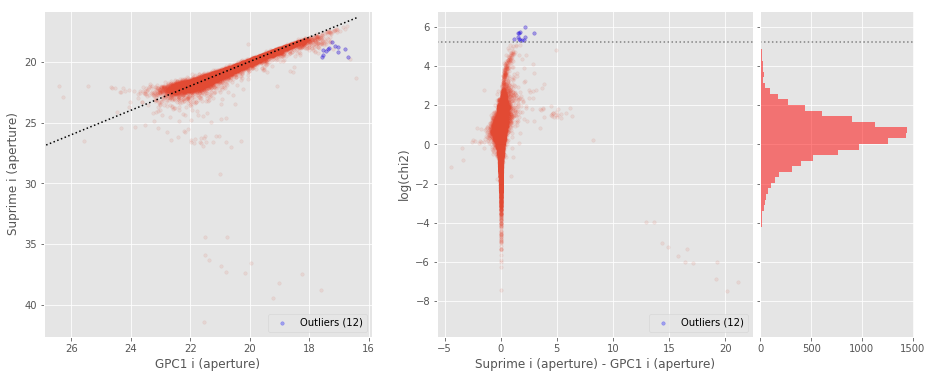

Suprime i (total) - GPC1 i (total) (11647 sources):
- Median: -0.19
- Median Absolute Deviation: 0.11
- 1% percentile: -0.7223954772949219
- 99% percentile: 1.327408523559564
Outliers separation: log(chi2) = 4.77
Number of outliers: 17



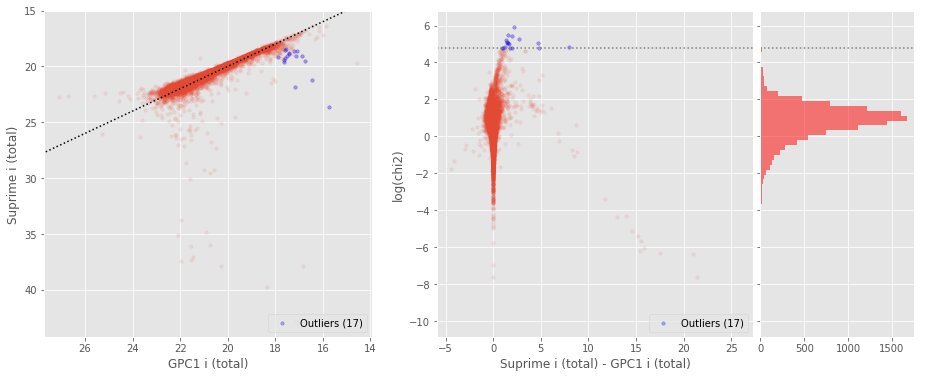

No sources have both GPC1 i (aperture) and RCS i (aperture) values.

RCS i (total) - GPC1 i (total) (37766 sources):
- Median: -0.26
- Median Absolute Deviation: 0.10
- 1% percentile: -0.825885009765625
- 99% percentile: 0.6832805633544881
Outliers separation: log(chi2) = 5.15
Number of outliers: 0



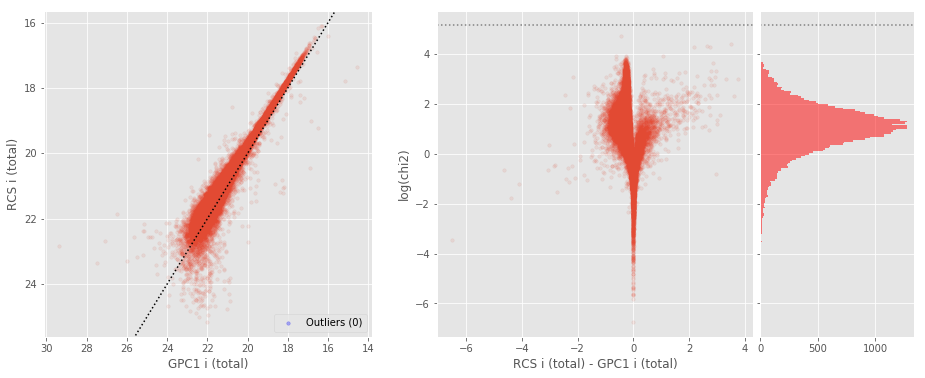

No sources have both SDSS i (aperture) and Suprime i (aperture) values.

No sources have both SDSS i (total) and Suprime i (total) values.

No sources have both SDSS i (aperture) and RCS i (aperture) values.

RCS i (total) - SDSS i (total) (20778 sources):
- Median: -0.09
- Median Absolute Deviation: 0.16
- 1% percentile: -0.9390832550659163
- 99% percentile: 1.4268233815002451
Outliers separation: log(chi2) = 5.02
Number of outliers: 0



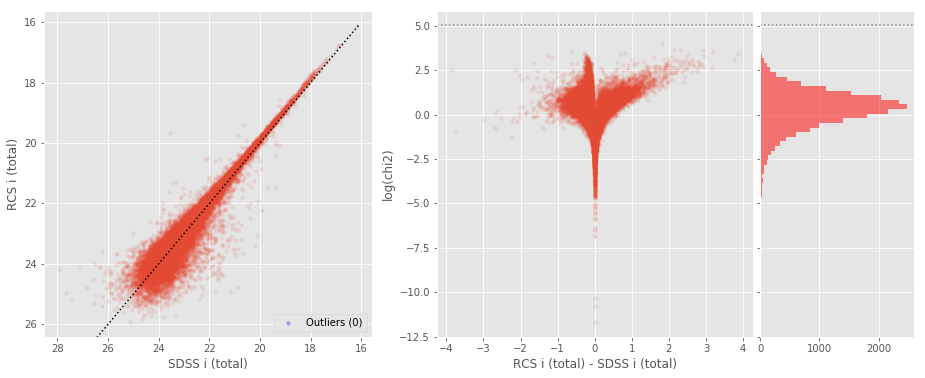

No sources have both Suprime i (aperture) and RCS i (aperture) values.

RCS i (total) - Suprime i (total) (50389 sources):
- Median: 0.01
- Median Absolute Deviation: 0.19
- 1% percentile: -2.2906301116943357
- 99% percentile: 1.1509046173095727
Outliers separation: log(chi2) = 5.49
Number of outliers: 27



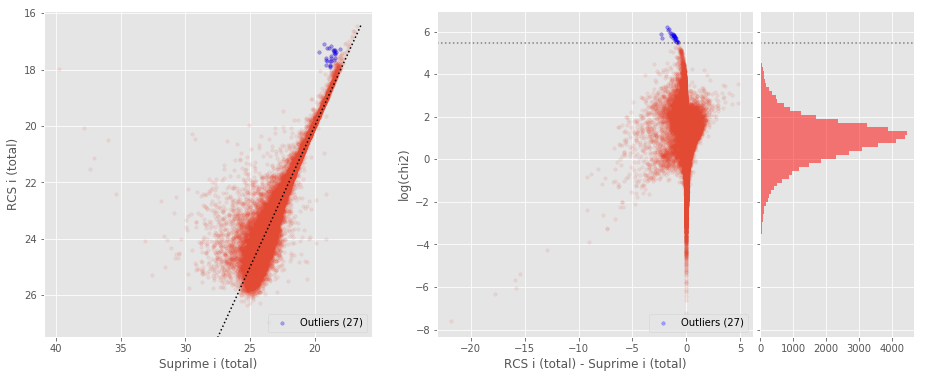

GPC1 z (aperture) - DECam z (aperture) (500265 sources):
- Median: 0.09
- Median Absolute Deviation: 0.14
- 1% percentile: -2.1351356887817383
- 99% percentile: 1.4540224456787108
Outliers separation: log(chi2) = 4.88
Number of outliers: 6738



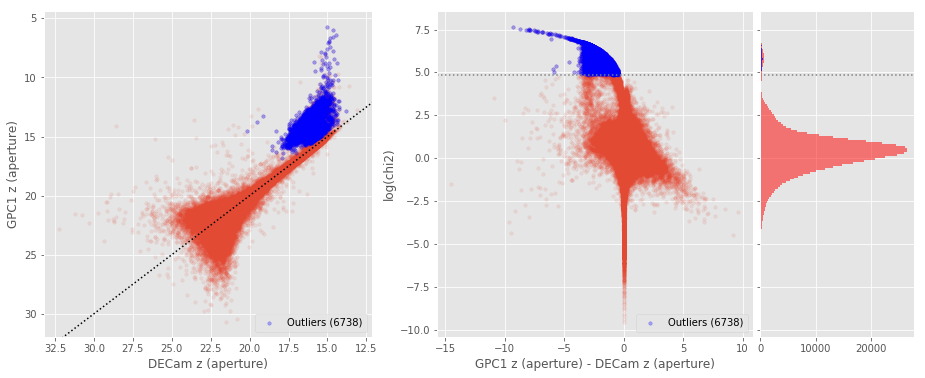

GPC1 z (total) - DECam z (total) (500662 sources):
- Median: 0.27
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1103314208984376
- 99% percentile: 1.454379558563233
Outliers separation: log(chi2) = 5.93
Number of outliers: 48



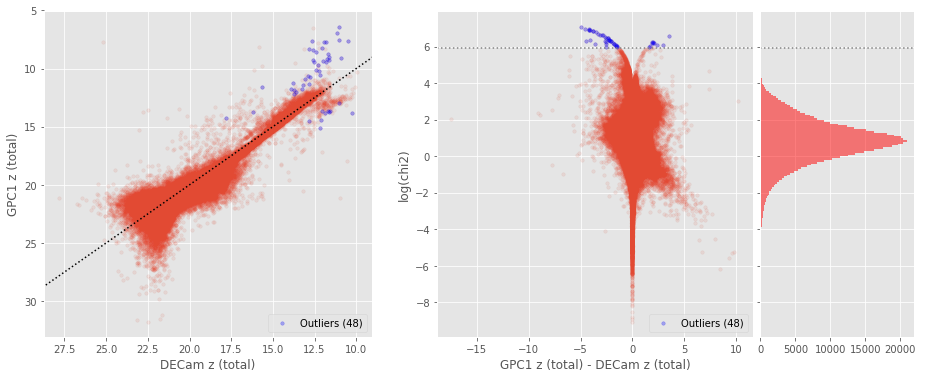

SDSS z (aperture) - DECam z (aperture) (448672 sources):
- Median: 0.59
- Median Absolute Deviation: 0.26
- 1% percentile: -2.0554444185791017
- 99% percentile: 2.4457099262695303
Outliers separation: log(chi2) = 6.70
Number of outliers: 0



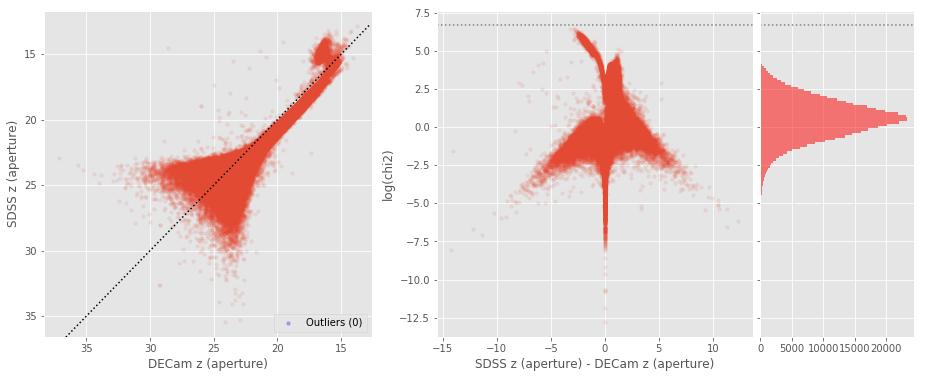

SDSS z (total) - DECam z (total) (450155 sources):
- Median: 0.09
- Median Absolute Deviation: 0.24
- 1% percentile: -1.8004996293945323
- 99% percentile: 2.6325343649902373
Outliers separation: log(chi2) = 4.31
Number of outliers: 162



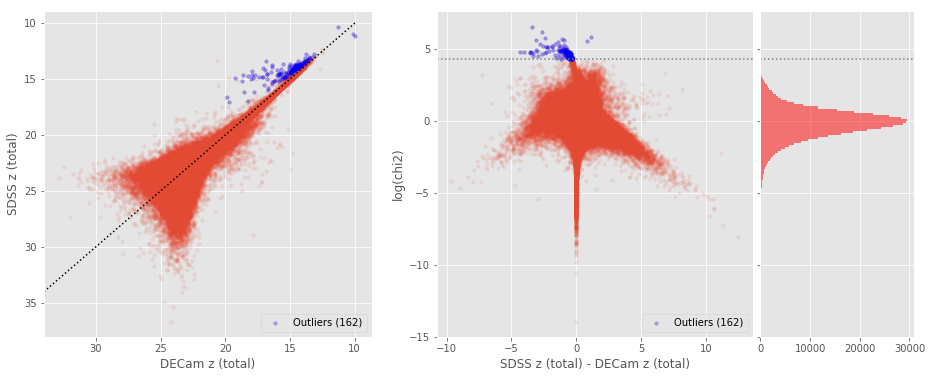

Suprime z (aperture) - DECam z (aperture) (60047 sources):
- Median: 0.10
- Median Absolute Deviation: 0.24
- 1% percentile: -2.8512701416015624
- 99% percentile: 1.6853060150146484
Outliers separation: log(chi2) = 5.33
Number of outliers: 12



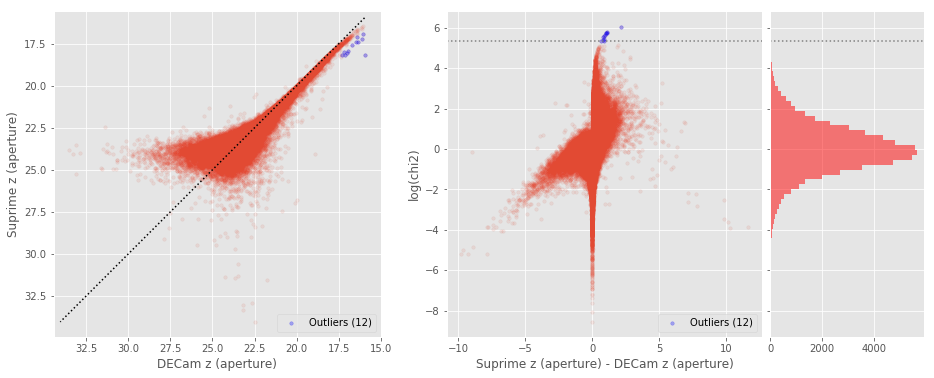

Suprime z (total) - DECam z (total) (62773 sources):
- Median: 0.02
- Median Absolute Deviation: 0.19
- 1% percentile: -1.7147566223144532
- 99% percentile: 1.6015958404540975
Outliers separation: log(chi2) = 4.90
Number of outliers: 39



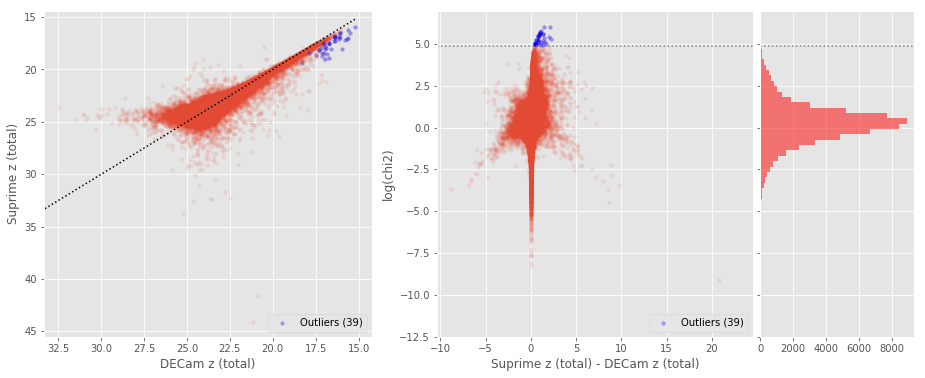

No sources have both DECam z (aperture) and RCS z (aperture) values.

RCS z (total) - DECam z (total) (424668 sources):
- Median: 0.03
- Median Absolute Deviation: 0.23
- 1% percentile: -1.6561821365356446
- 99% percentile: 1.3318465232849168
Outliers separation: log(chi2) = 5.14
Number of outliers: 12



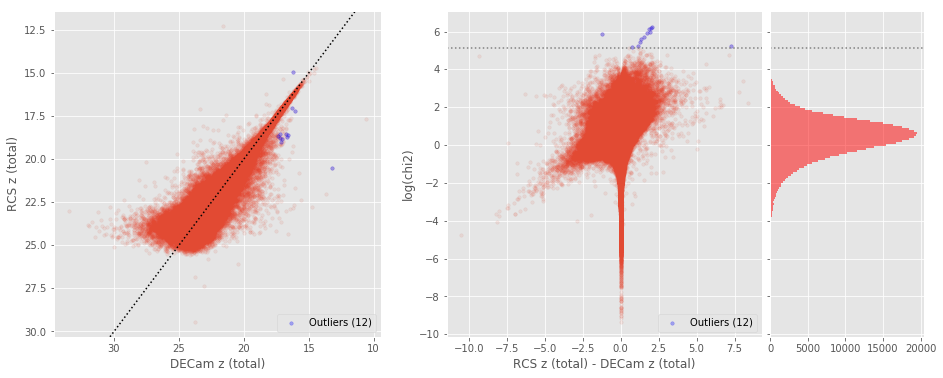

SDSS z (aperture) - GPC1 z (aperture) (143252 sources):
- Median: 0.54
- Median Absolute Deviation: 0.22
- 1% percentile: -0.9453999288330075
- 99% percentile: 1.564947363952633
Outliers separation: log(chi2) = 6.04
Number of outliers: 0



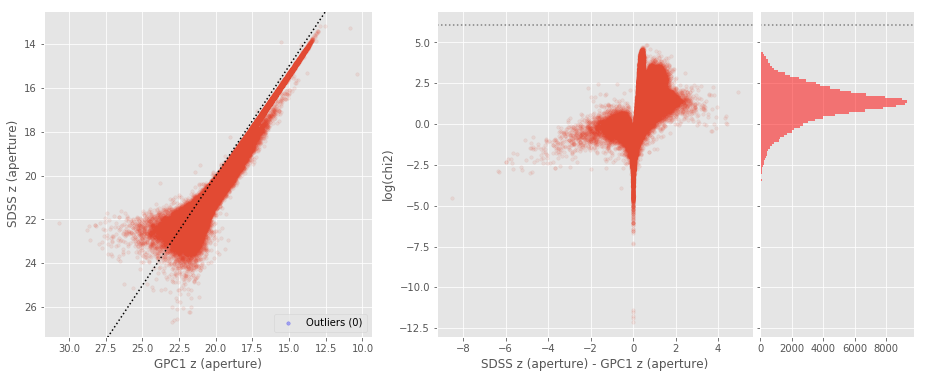

SDSS z (total) - GPC1 z (total) (143157 sources):
- Median: -0.17
- Median Absolute Deviation: 0.13
- 1% percentile: -1.1529006408691411
- 99% percentile: 1.192888483276367
Outliers separation: log(chi2) = 5.14
Number of outliers: 0



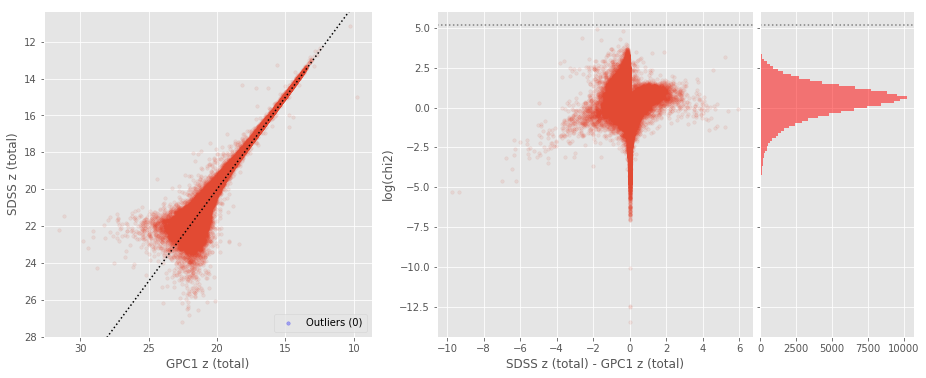

Suprime z (aperture) - GPC1 z (aperture) (11640 sources):
- Median: -0.00
- Median Absolute Deviation: 0.15
- 1% percentile: -1.2945173072814942
- 99% percentile: 1.120867881774903
Outliers separation: log(chi2) = 4.97
Number of outliers: 1



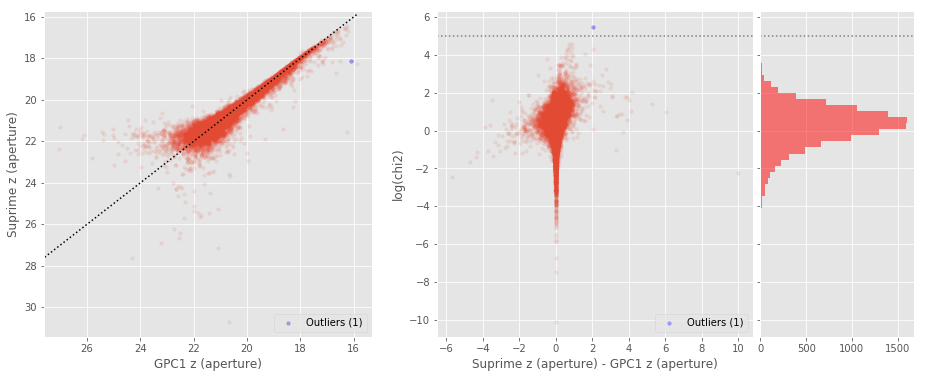

Suprime z (total) - GPC1 z (total) (11612 sources):
- Median: -0.17
- Median Absolute Deviation: 0.13
- 1% percentile: -1.0127337074279785
- 99% percentile: 1.1070509338378889
Outliers separation: log(chi2) = 4.91
Number of outliers: 1



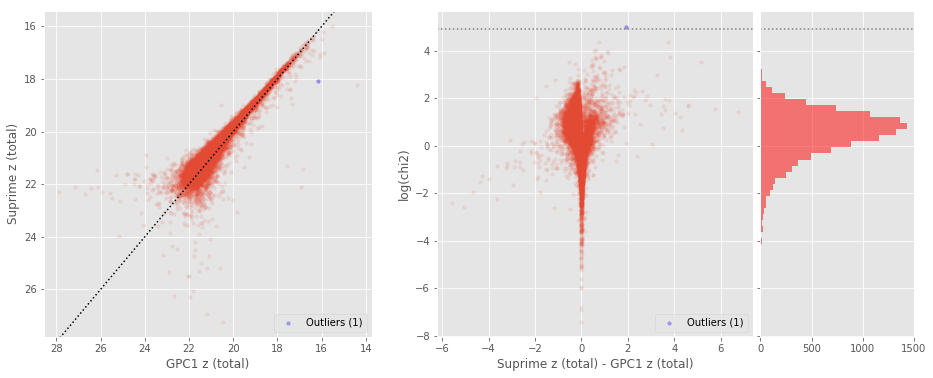

No sources have both GPC1 z (aperture) and RCS z (aperture) values.

RCS z (total) - GPC1 z (total) (132048 sources):
- Median: -0.24
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1760531616210939
- 99% percentile: 1.1817067146301268
Outliers separation: log(chi2) = 5.44
Number of outliers: 1



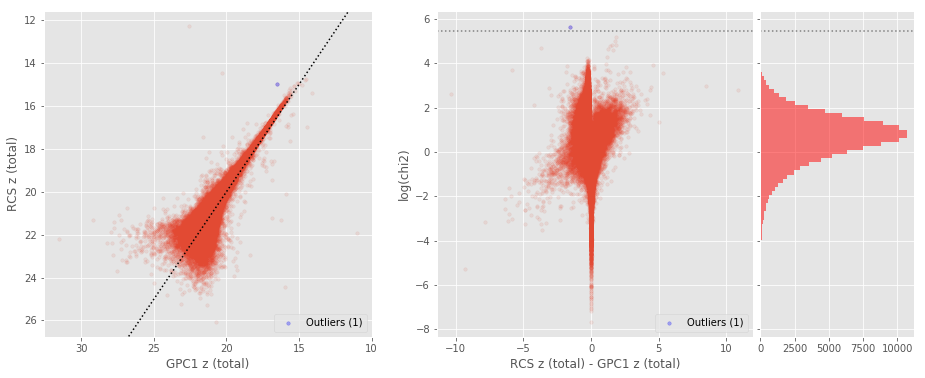

No sources have both SDSS z (aperture) and Suprime z (aperture) values.

No sources have both SDSS z (total) and Suprime z (total) values.

No sources have both SDSS z (aperture) and RCS z (aperture) values.



/data/vault/epons/conda_envs/herschelhelp_internal/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


RCS z (total) - SDSS z (total) (101487 sources):
- Median: -0.05
- Median Absolute Deviation: 0.27
- 1% percentile: -2.5915972451171867
- 99% percentile: 1.4944283287963875
Outliers separation: log(chi2) = 4.28
Number of outliers: 7



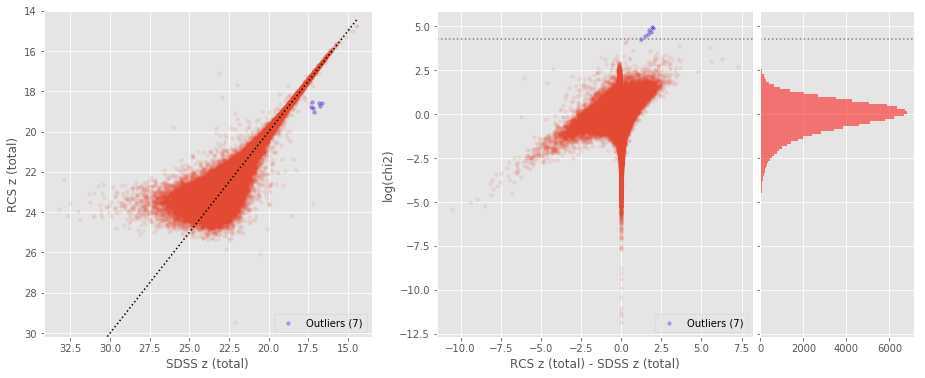

No sources have both Suprime z (aperture) and RCS z (aperture) values.

RCS z (total) - Suprime z (total) (51445 sources):
- Median: -0.04
- Median Absolute Deviation: 0.21
- 1% percentile: -1.9193576049804686
- 99% percentile: 1.0926615142822262
Outliers separation: log(chi2) = 5.53
Number of outliers: 5



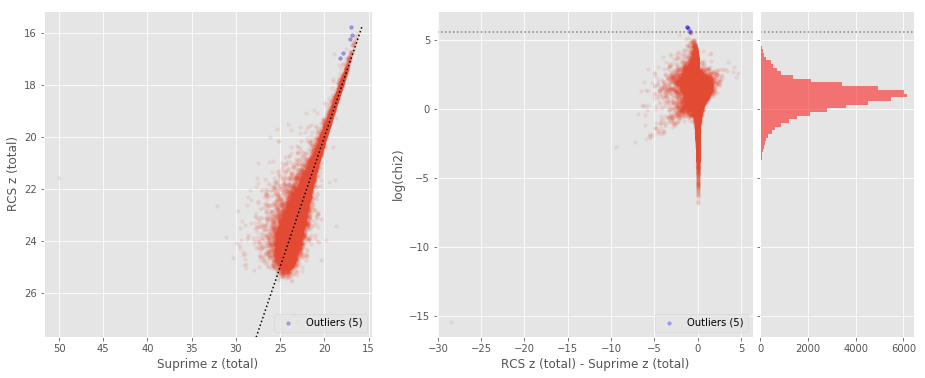

Suprime y (aperture) - GPC1 y (aperture) (11469 sources):
- Median: 0.11
- Median Absolute Deviation: 0.23
- 1% percentile: -1.7991735839843748
- 99% percentile: 1.8983014678955072
Outliers separation: log(chi2) = 5.17
Number of outliers: 4



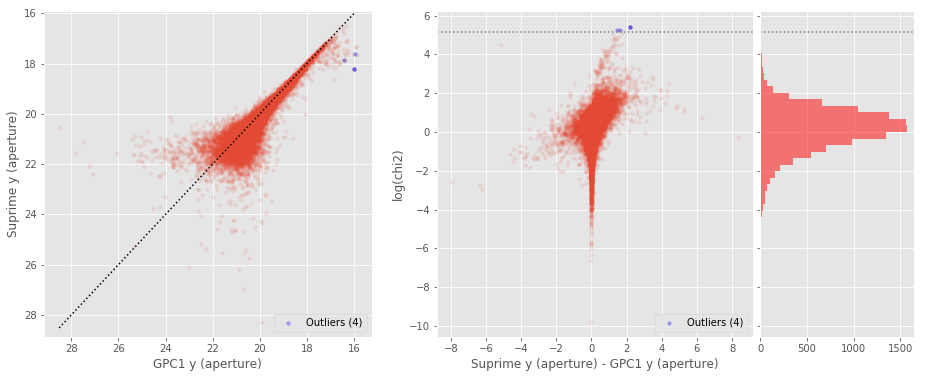

Suprime y (total) - GPC1 y (total) (11279 sources):
- Median: -0.15
- Median Absolute Deviation: 0.25
- 1% percentile: -1.6497690963745117
- 99% percentile: 2.1316806030273425
Outliers separation: log(chi2) = 5.48
Number of outliers: 0



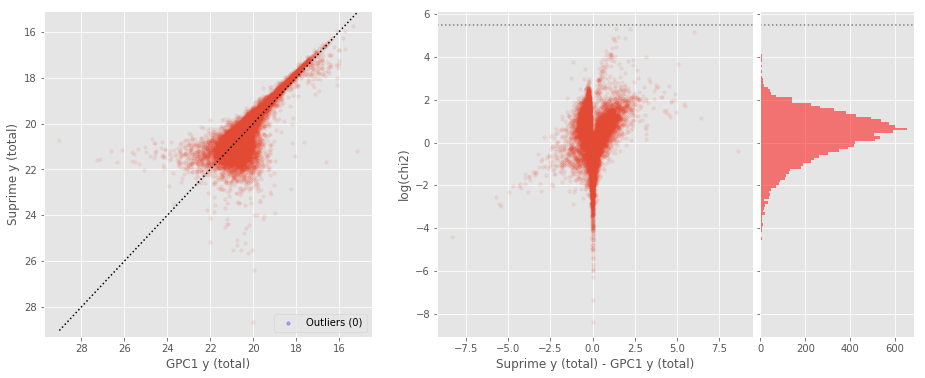

No sources have both GPC1 y (aperture) and RCS y (aperture) values.

RCS y (total) - GPC1 y (total) (40221 sources):
- Median: 0.47
- Median Absolute Deviation: 0.39
- 1% percentile: -1.4632400512695314
- 99% percentile: 2.727959060668946
Outliers separation: log(chi2) = 6.01
Number of outliers: 0



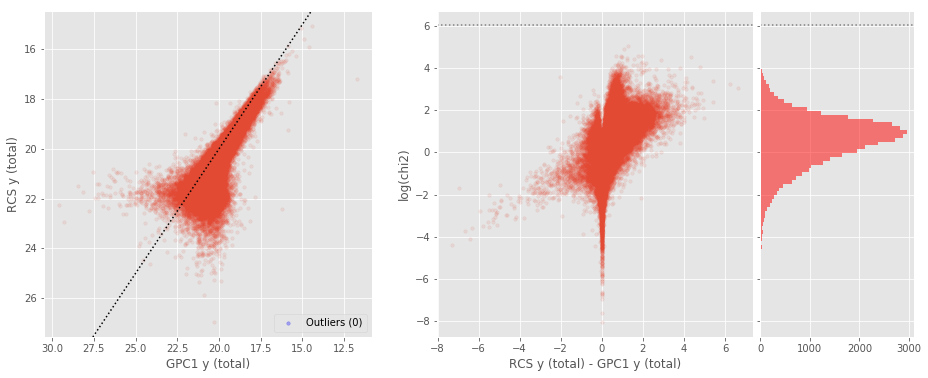

VHS Y (aperture) - GPC1 y (aperture) (68852 sources):
- Median: 0.05
- Median Absolute Deviation: 0.20
- 1% percentile: -1.4580602073669433
- 99% percentile: 1.079011898040772
Outliers separation: log(chi2) = 5.31
Number of outliers: 28



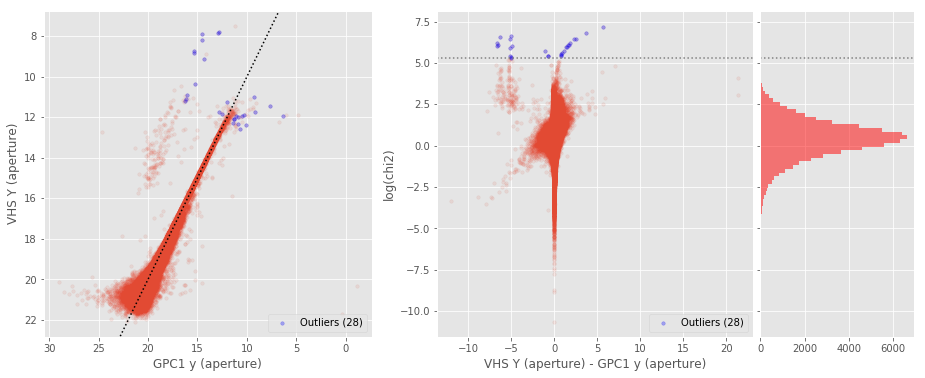

VHS Y (total) - GPC1 y (total) (68709 sources):
- Median: -0.15
- Median Absolute Deviation: 0.18
- 1% percentile: -1.2063194274902345
- 99% percentile: 1.3054595184326165
Outliers separation: log(chi2) = 5.24
Number of outliers: 18



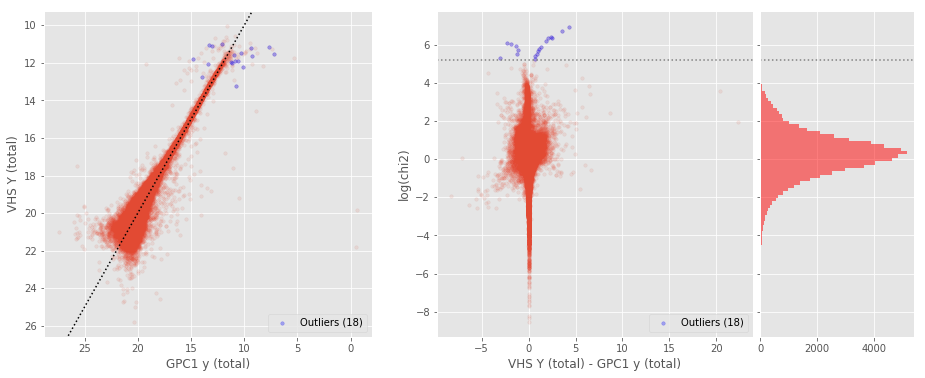

UKIDSS Y (aperture) - GPC1 y (aperture) (165175 sources):
- Median: 0.15
- Median Absolute Deviation: 0.22
- 1% percentile: -1.1051537322998046
- 99% percentile: 1.1605104827880872
Outliers separation: log(chi2) = 5.32
Number of outliers: 40



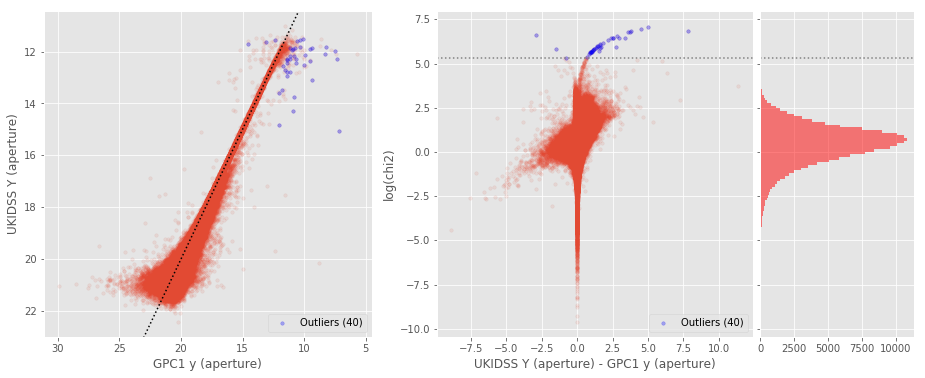

UKIDSS Y (total) - GPC1 y (total) (164847 sources):
- Median: -0.08
- Median Absolute Deviation: 0.16
- 1% percentile: -1.1228889083862303
- 99% percentile: 1.4015650177001957
Outliers separation: log(chi2) = 4.75
Number of outliers: 79



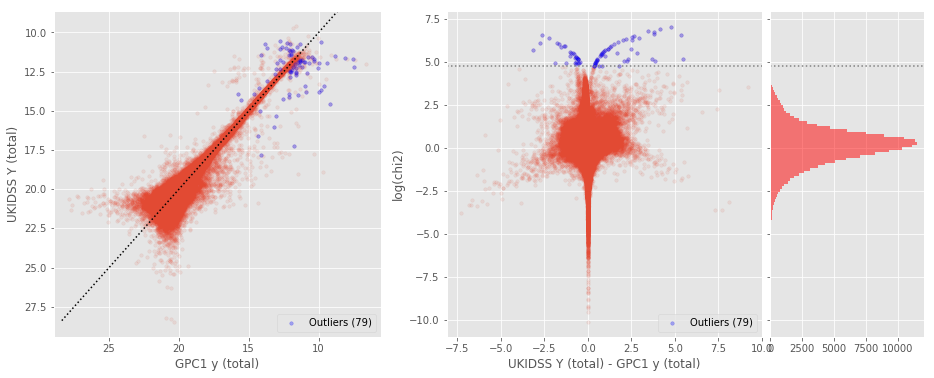

No sources have both Suprime y (aperture) and RCS y (aperture) values.

RCS y (total) - Suprime y (total) (5113 sources):
- Median: 0.53
- Median Absolute Deviation: 0.32
- 1% percentile: -1.3908543395996094
- 99% percentile: 2.1912711334228554
Outliers separation: log(chi2) = 6.93
Number of outliers: 0



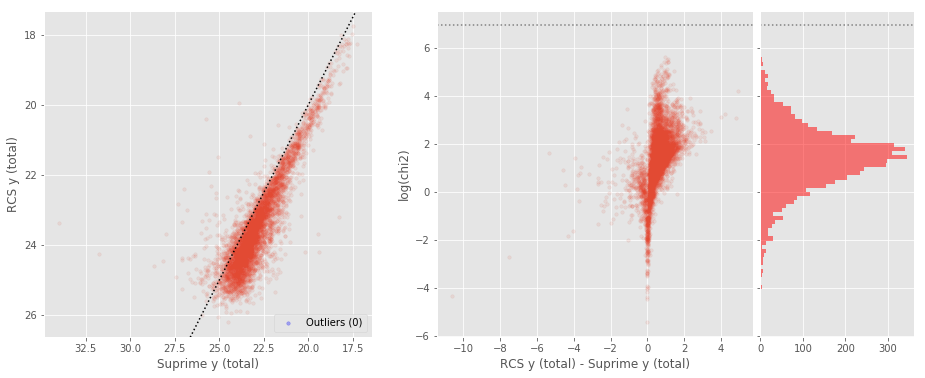

VHS Y (aperture) - Suprime y (aperture) (183 sources):
- Median: -0.04
- Median Absolute Deviation: 0.13
- 1% percentile: -5.783206024169922
- 99% percentile: 0.5436531829833986
Outliers separation: log(chi2) = 4.86
Number of outliers: 1



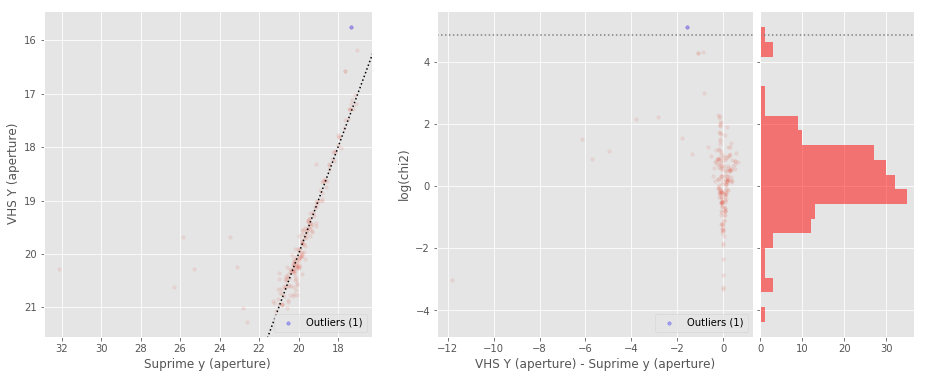

VHS Y (total) - Suprime y (total) (182 sources):
- Median: -0.01
- Median Absolute Deviation: 0.18
- 1% percentile: -4.1186545753479
- 99% percentile: 1.0063447952270506
Outliers separation: log(chi2) = 4.83
Number of outliers: 0



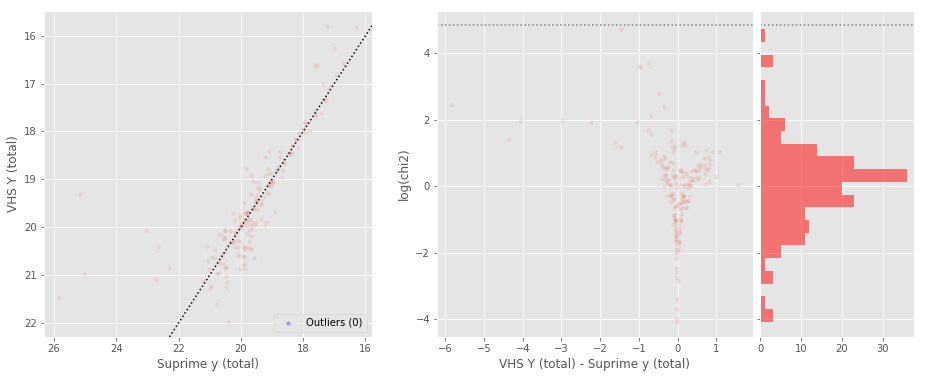

UKIDSS Y (aperture) - Suprime y (aperture) (5205 sources):
- Median: 0.08
- Median Absolute Deviation: 0.13
- 1% percentile: -1.0824210357666015
- 99% percentile: 0.6076422119140625
Outliers separation: log(chi2) = 4.95
Number of outliers: 6



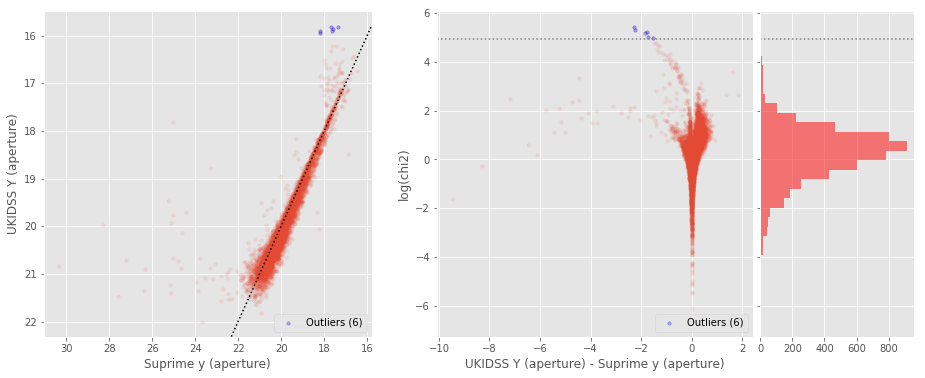

UKIDSS Y (total) - Suprime y (total) (5193 sources):
- Median: 0.10
- Median Absolute Deviation: 0.15
- 1% percentile: -1.2867385101318358
- 99% percentile: 1.1423934173583983
Outliers separation: log(chi2) = 4.21
Number of outliers: 12



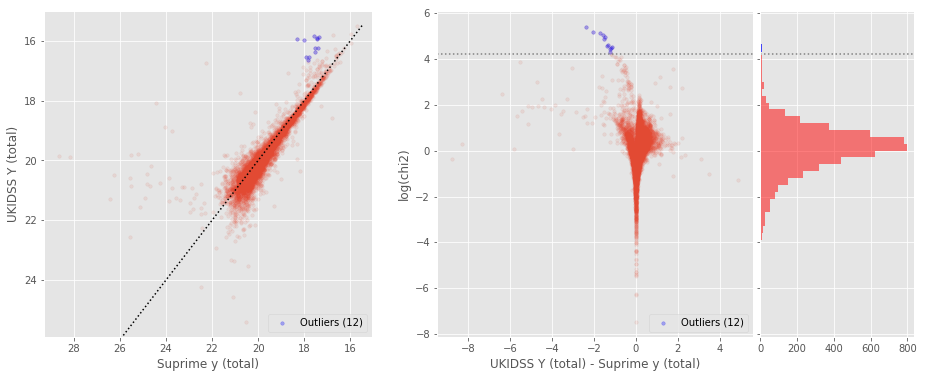

No sources have both RCS y (aperture) and VHS Y (aperture) values.

VHS Y (total) - RCS y (total) (3217 sources):
- Median: -0.47
- Median Absolute Deviation: 0.31
- 1% percentile: -3.0394248962402344
- 99% percentile: 0.746319580078125
Outliers separation: log(chi2) = 5.51
Number of outliers: 0



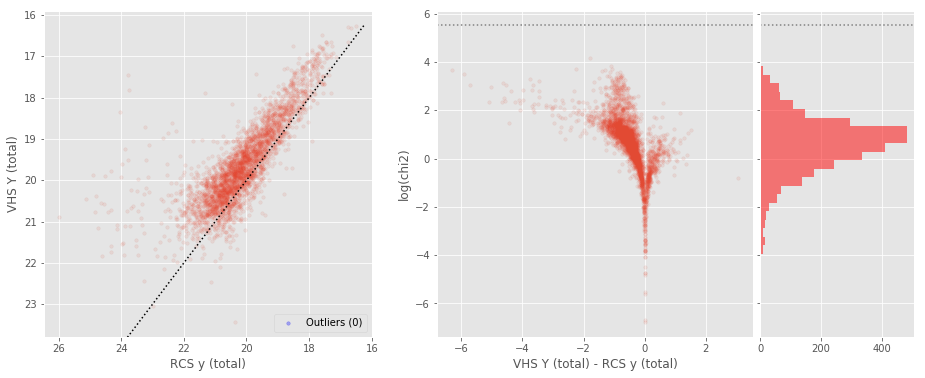

No sources have both RCS y (aperture) and UKIDSS Y (aperture) values.

UKIDSS Y (total) - RCS y (total) (11043 sources):
- Median: -0.39
- Median Absolute Deviation: 0.29
- 1% percentile: -2.155640106201172
- 99% percentile: 0.8123551559448239
Outliers separation: log(chi2) = 6.04
Number of outliers: 0



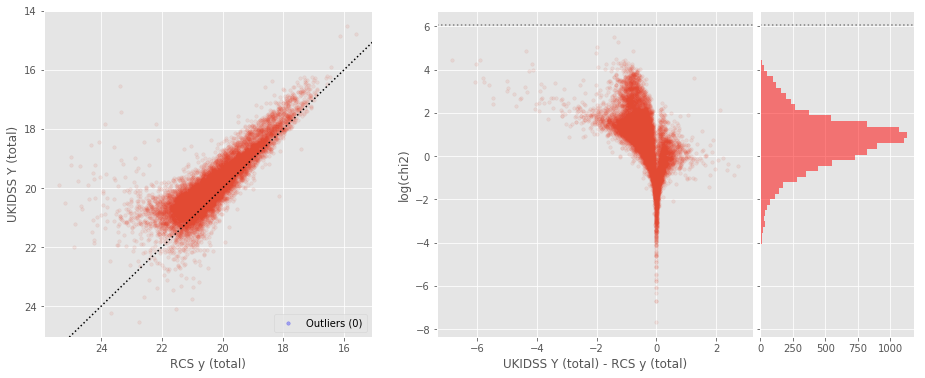

No sources have both VHS Y (aperture) and UKIDSS Y (aperture) values.

No sources have both VHS Y (total) and UKIDSS Y (total) values.

UKIDSS J (aperture) - VHS J (aperture) (44369 sources):
- Median: 0.03
- Median Absolute Deviation: 0.07
- 1% percentile: -0.5630474090576172
- 99% percentile: 0.544174575805664
Outliers separation: log(chi2) = 4.25
Number of outliers: 398



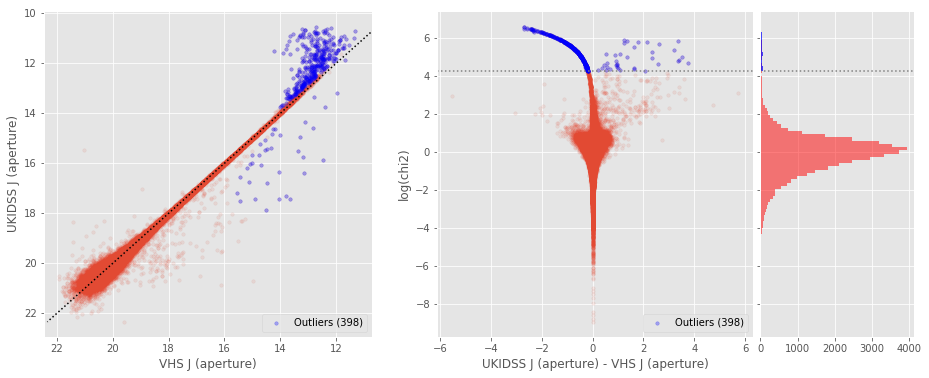

UKIDSS J (total) - VHS J (total) (44374 sources):
- Median: 0.09
- Median Absolute Deviation: 0.15
- 1% percentile: -0.8497722434997559
- 99% percentile: 1.2258838081359853
Outliers separation: log(chi2) = 4.82
Number of outliers: 240



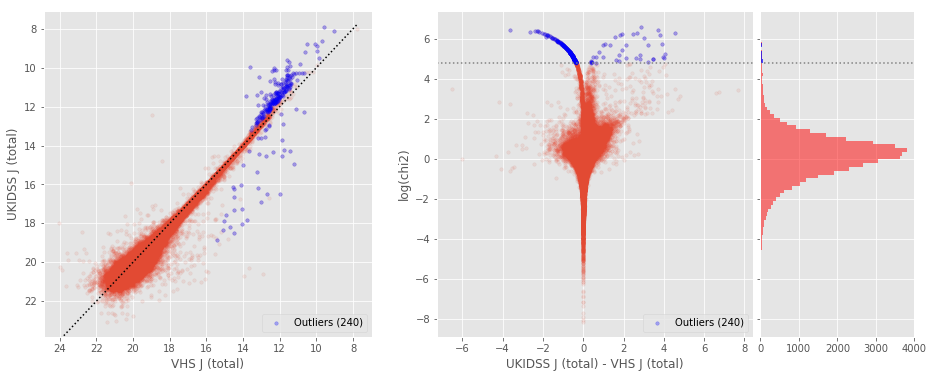

No sources have both VHS J (aperture) and VICS82 J (aperture) values.

No sources have both VHS J (total) and VICS82 J (total) values.

No sources have both UKIDSS J (aperture) and VICS82 J (aperture) values.

No sources have both UKIDSS J (total) and VICS82 J (total) values.

UKIDSS H (aperture) - VHS H (aperture) (47940 sources):
- Median: -0.02
- Median Absolute Deviation: 0.07
- 1% percentile: -0.7017165756225586
- 99% percentile: 0.3929036521911624
Outliers separation: log(chi2) = 4.10
Number of outliers: 471



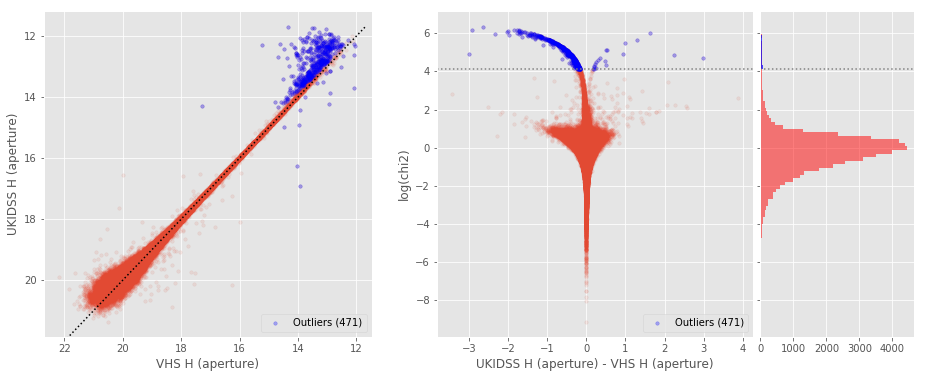

UKIDSS H (total) - VHS H (total) (47918 sources):
- Median: 0.01
- Median Absolute Deviation: 0.16
- 1% percentile: -1.1395844078063966
- 99% percentile: 1.1315725898742681
Outliers separation: log(chi2) = 4.05
Number of outliers: 421



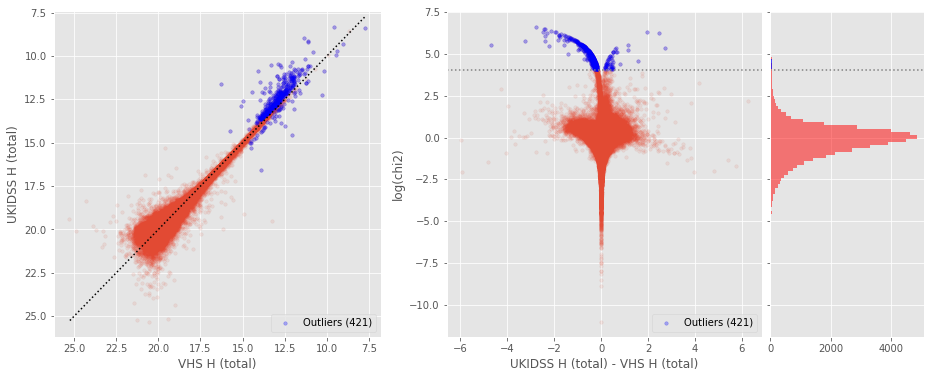

UKIDSS K (aperture) - VHS K (aperture) (57900 sources):
- Median: 0.01
- Median Absolute Deviation: 0.09
- 1% percentile: -0.6475127029418946
- 99% percentile: 0.4219000053405762
Outliers separation: log(chi2) = 4.15
Number of outliers: 228



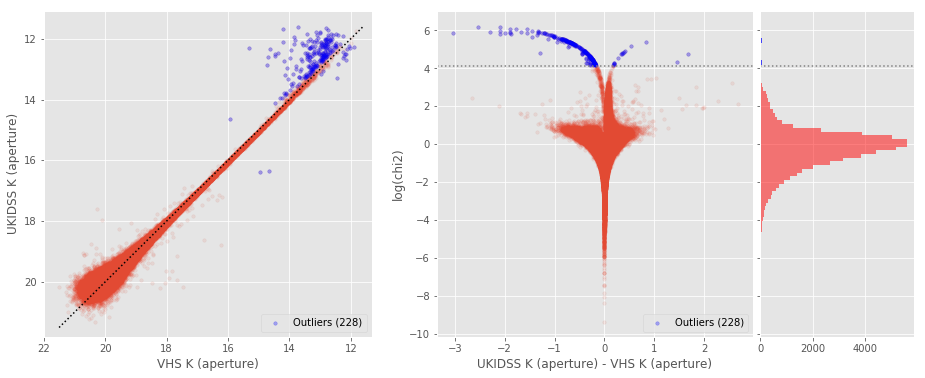

UKIDSS K (total) - VHS K (total) (57876 sources):
- Median: 0.06
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1438078880310059
- 99% percentile: 1.1813421249389648
Outliers separation: log(chi2) = 4.10
Number of outliers: 200



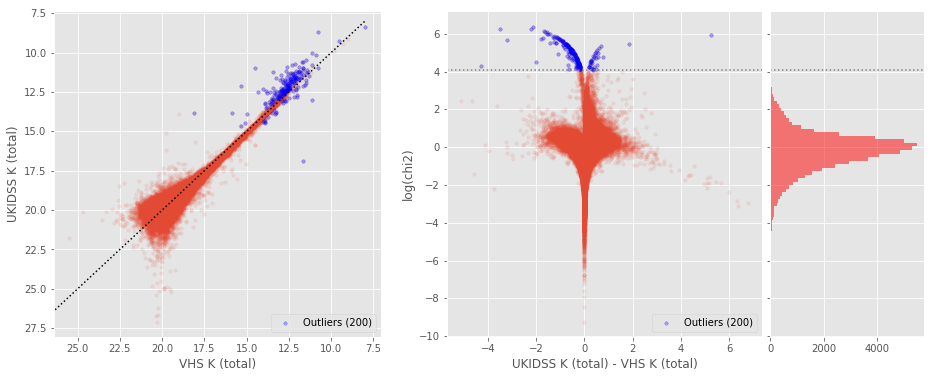

No sources have both VHS K (aperture) and VICS82 K (aperture) values.

No sources have both VHS K (total) and VICS82 K (total) values.

No sources have both UKIDSS K (aperture) and VICS82 K (aperture) values.

No sources have both UKIDSS K (total) and VICS82 K (total) values.



In [22]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        if basecol1 == "decam_r" and basecol2 == "gpc1_r":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2],
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
        
        # Tot mag
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        ecol1, ecol2 = "merr_{}".format(basecol1), "merr_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2], 
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (total)".format(band1), "{} (total)".format(band2)))
        
for j in range(40):
    plt.close() 

## 4/ Aperture correction issues

In [23]:
def apcor_check(x, y, stellarity, labels=["x", "y"], savefig=False):
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    #fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))   # 
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    stellarity = np.copy(stellarity[mask])


    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    
    diff_label = "{} - {}".format(y_label, x_label)
    print("{}:".format(diff_label))
    
    # Subsample
    zoom = (x > 16) & (x < 20)


    # Comparing mag
    ax1.scatter(x, diff, marker='.', alpha=0.1, s=50)
    ax1.invert_xaxis()
    ax1.set_ylabel(diff_label)
    ax1.set_xlabel(x_label)
    

    # Zoom Plot
    y_min, y_max = np.percentile(diff[zoom], [1., 99.])
    y_delta = .1 * (y_max - y_min)
    y_min -= y_delta
    y_max += y_delta

    if len(x[zoom]) < 1000:
        alpha = 0.4
    else:
        alpha = 0.1
    pl = ax2.scatter(x[zoom], diff[zoom], marker='.', alpha=alpha, s=50, c=stellarity[zoom], cmap="jet")
    ax2.invert_xaxis()
    ax2.set_ylabel(diff_label)
    ax2.set_xlabel(x_label)
    ax2.set_ylim([y_min, y_max])
    fig.colorbar(pl, label="stellarity (1=star)")
    
    #ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(diff[zoom], ax=ax3, bins='knuth', facecolor='black', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_apcorrIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

GPC1 g (aperture) - DECam g (aperture):


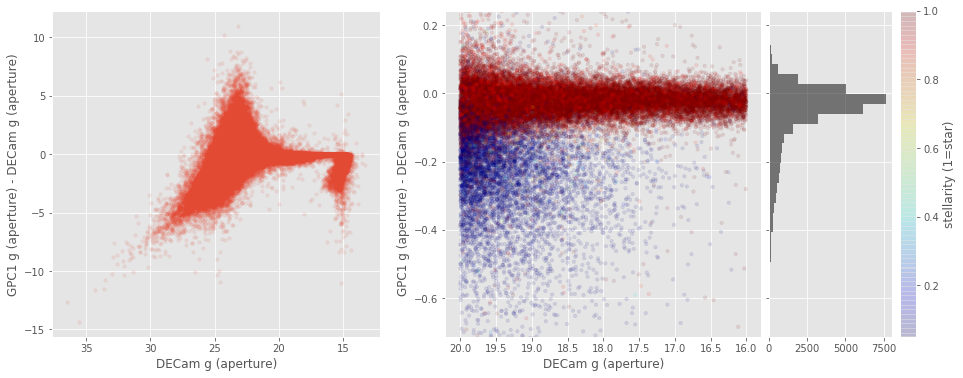

SDSS g (aperture) - DECam g (aperture):


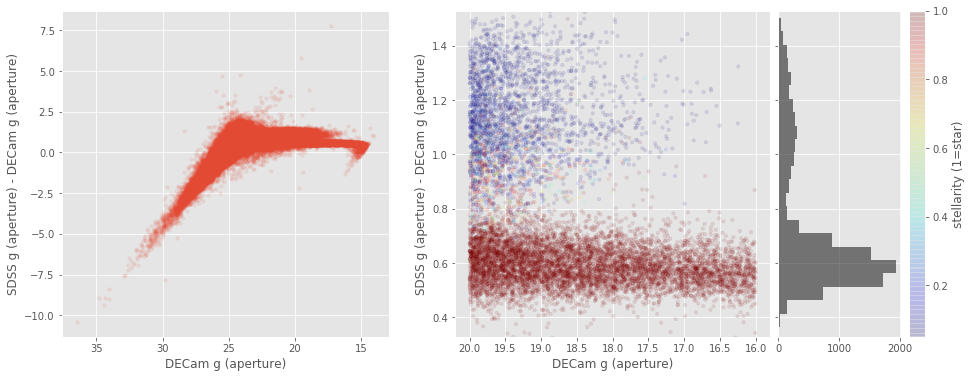

Suprime g (aperture) - DECam g (aperture):


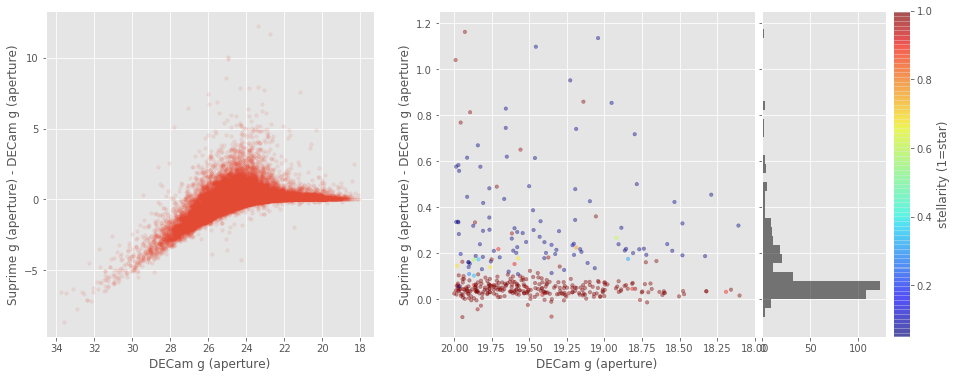

No sources have both DECam g (aperture) and RCS g (aperture) values.

SDSS g (aperture) - GPC1 g (aperture):


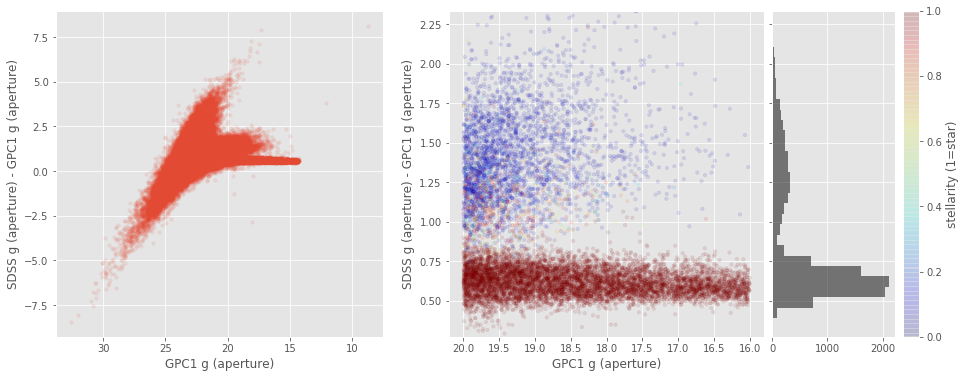

Suprime g (aperture) - GPC1 g (aperture):


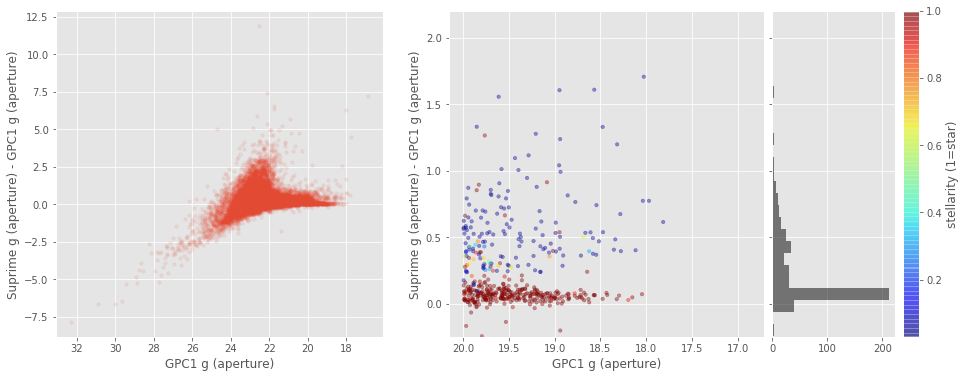

No sources have both GPC1 g (aperture) and RCS g (aperture) values.

No sources have both SDSS g (aperture) and Suprime g (aperture) values.

No sources have both SDSS g (aperture) and RCS g (aperture) values.

No sources have both Suprime g (aperture) and RCS g (aperture) values.

GPC1 r (aperture) - DECam r (aperture):


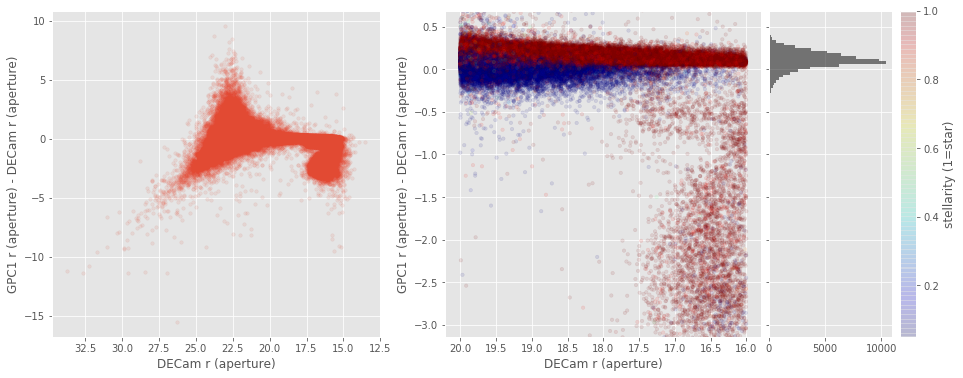

SDSS r (aperture) - DECam r (aperture):


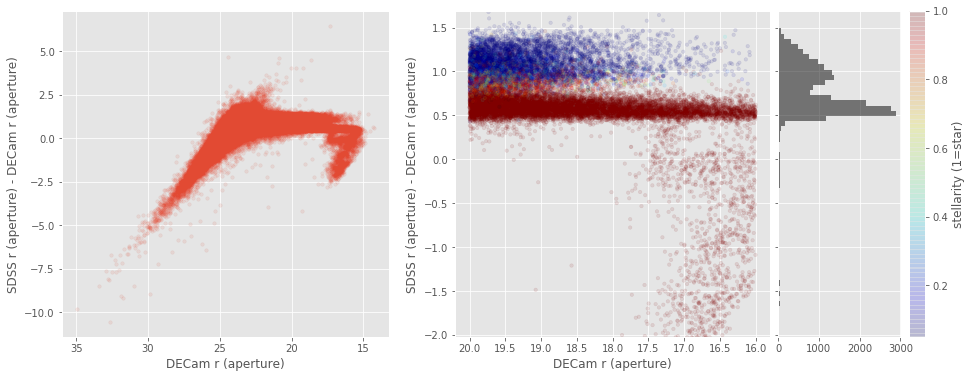

Suprime r (aperture) - DECam r (aperture):


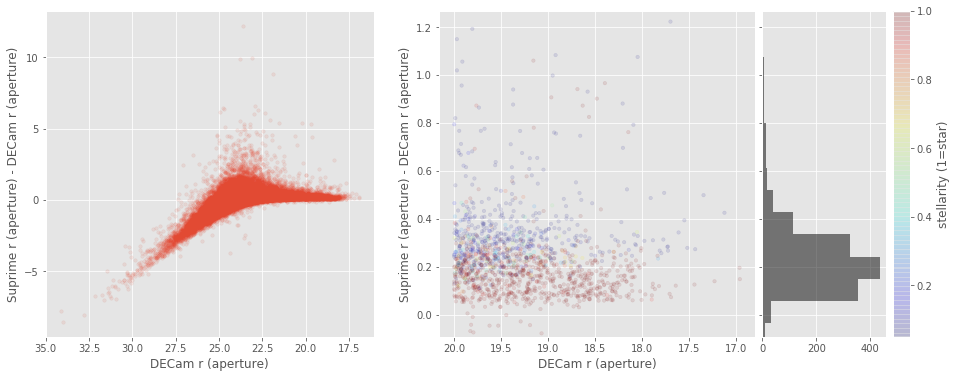

No sources have both DECam r (aperture) and RCS r (aperture) values.

SDSS r (aperture) - GPC1 r (aperture):


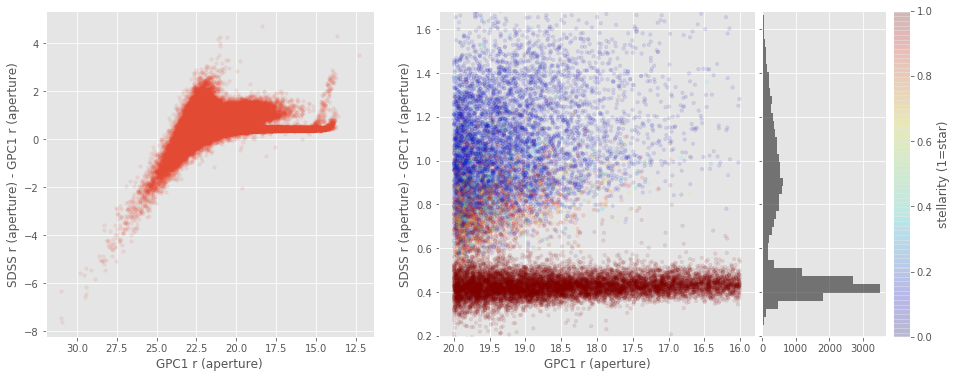

Suprime r (aperture) - GPC1 r (aperture):


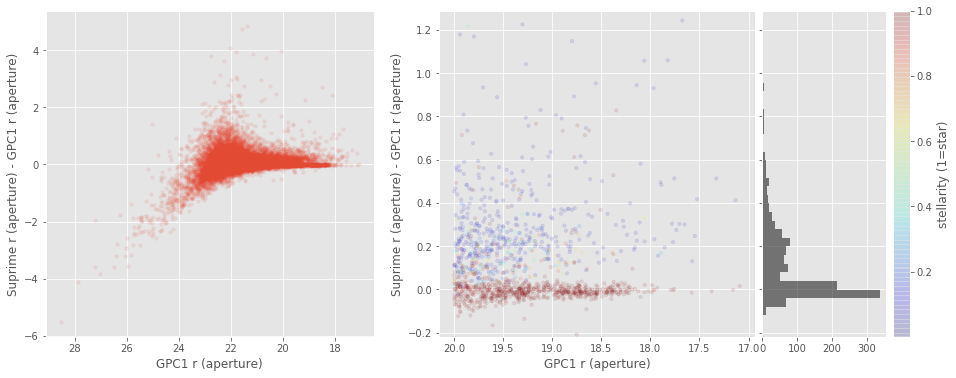

No sources have both GPC1 r (aperture) and RCS r (aperture) values.

No sources have both SDSS r (aperture) and Suprime r (aperture) values.

No sources have both SDSS r (aperture) and RCS r (aperture) values.

No sources have both Suprime r (aperture) and RCS r (aperture) values.

SDSS i (aperture) - GPC1 i (aperture):


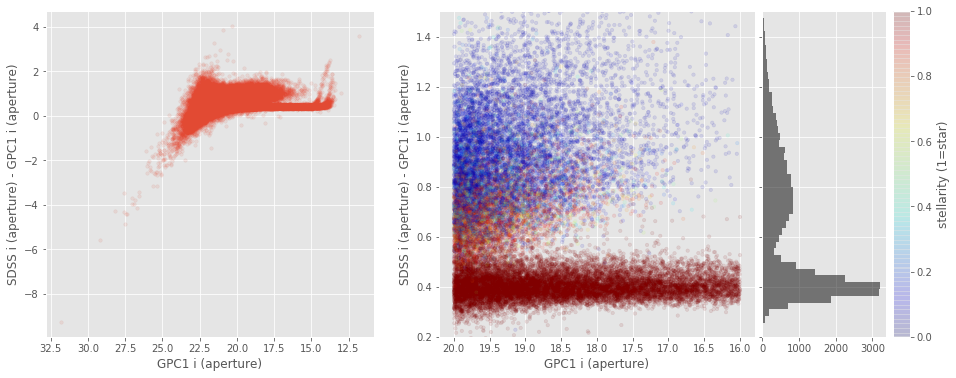

Suprime i (aperture) - GPC1 i (aperture):


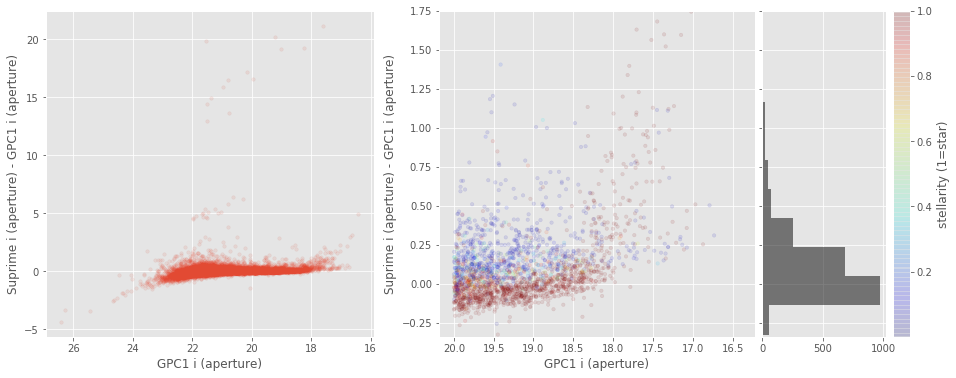

No sources have both GPC1 i (aperture) and RCS i (aperture) values.

No sources have both SDSS i (aperture) and Suprime i (aperture) values.

No sources have both SDSS i (aperture) and RCS i (aperture) values.

No sources have both Suprime i (aperture) and RCS i (aperture) values.

GPC1 z (aperture) - DECam z (aperture):


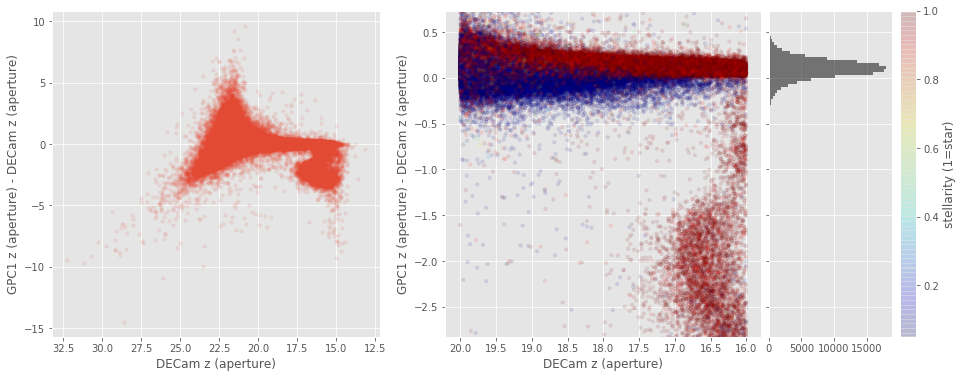

SDSS z (aperture) - DECam z (aperture):


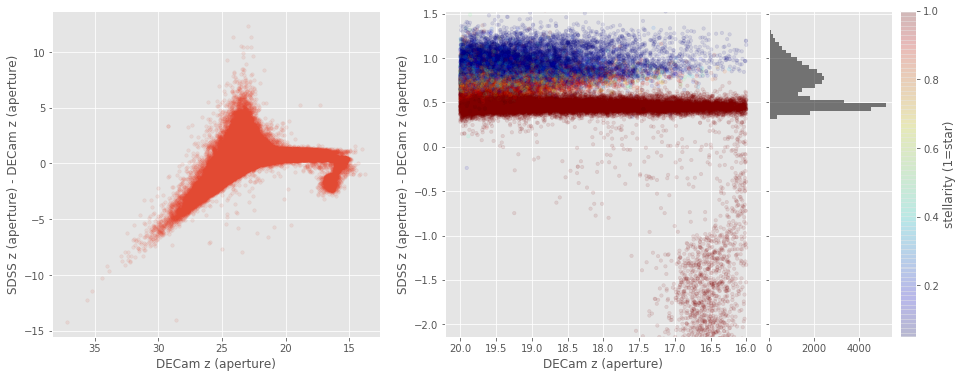

Suprime z (aperture) - DECam z (aperture):


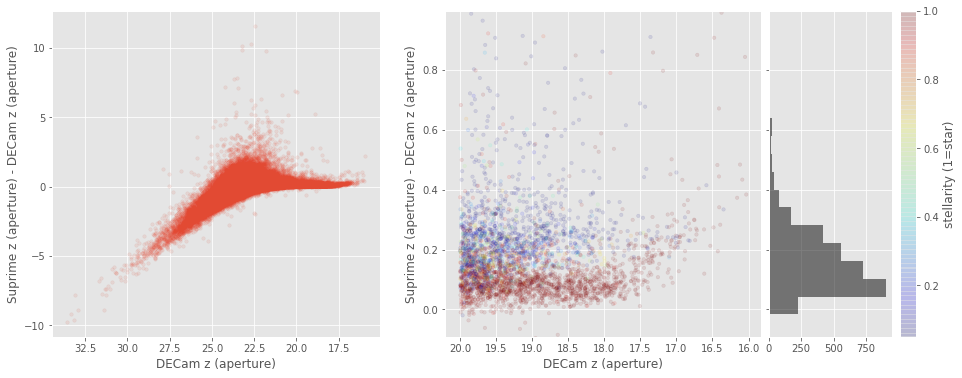

No sources have both DECam z (aperture) and RCS z (aperture) values.

SDSS z (aperture) - GPC1 z (aperture):


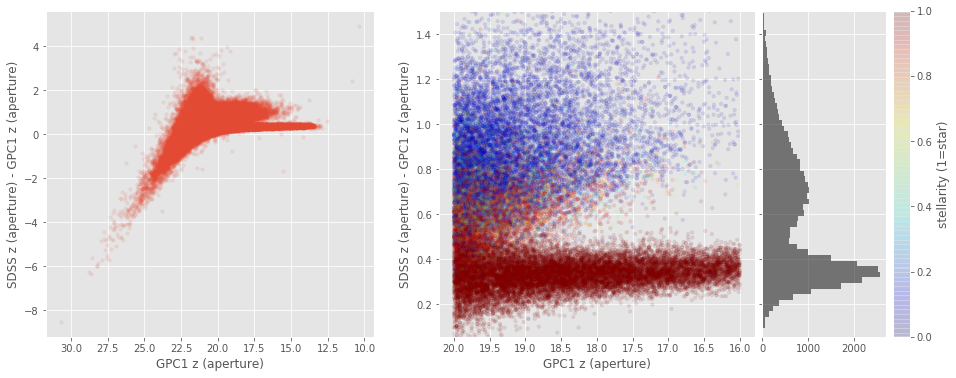

Suprime z (aperture) - GPC1 z (aperture):


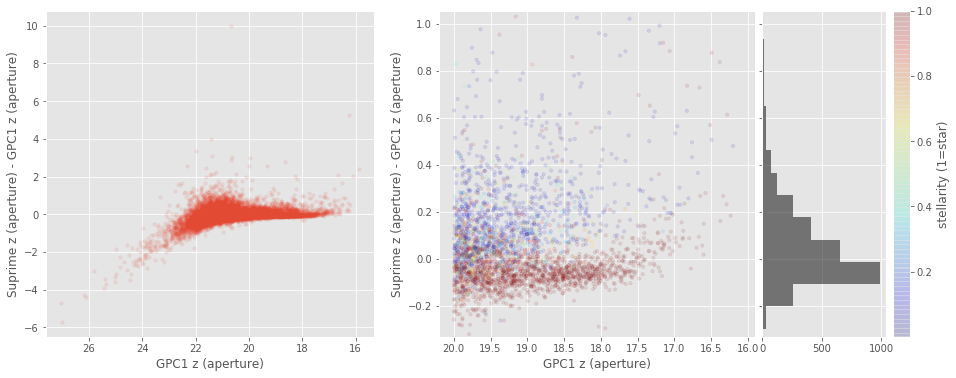

No sources have both GPC1 z (aperture) and RCS z (aperture) values.

No sources have both SDSS z (aperture) and Suprime z (aperture) values.

No sources have both SDSS z (aperture) and RCS z (aperture) values.

No sources have both Suprime z (aperture) and RCS z (aperture) values.

Suprime y (aperture) - GPC1 y (aperture):


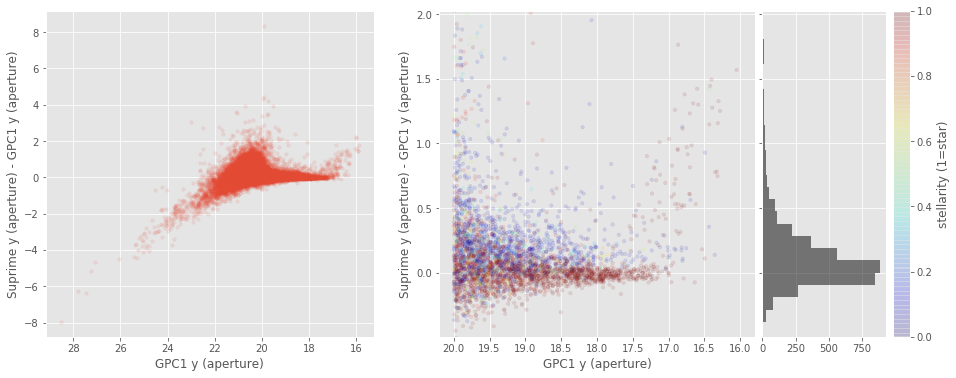

No sources have both GPC1 y (aperture) and RCS y (aperture) values.

VHS Y (aperture) - GPC1 y (aperture):


/data/vault/epons/conda_envs/herschelhelp_internal/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


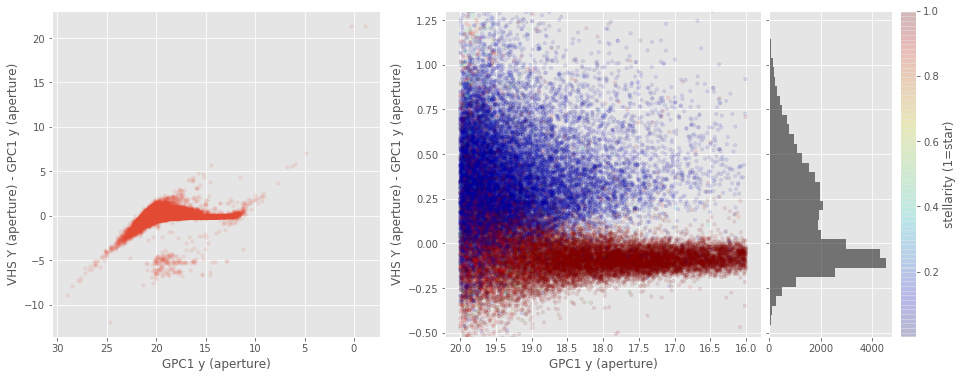

UKIDSS Y (aperture) - GPC1 y (aperture):


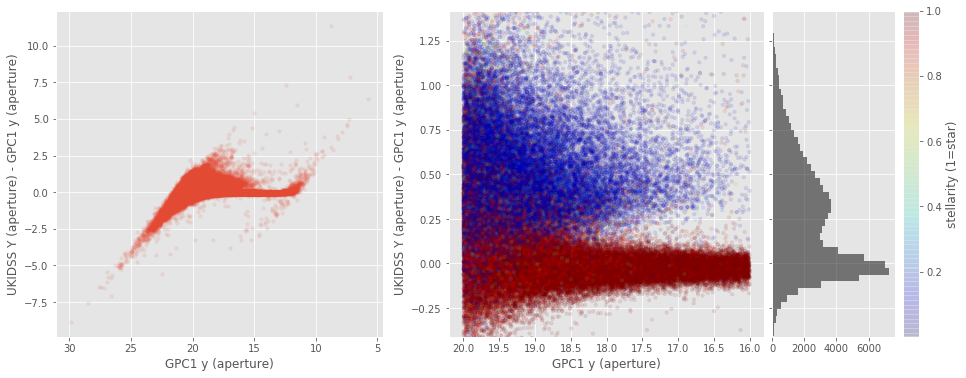

No sources have both Suprime y (aperture) and RCS y (aperture) values.

VHS Y (aperture) - Suprime y (aperture):


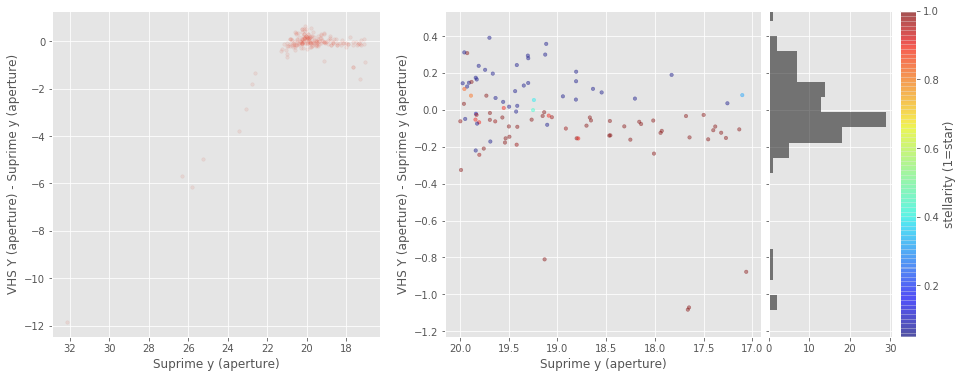

UKIDSS Y (aperture) - Suprime y (aperture):


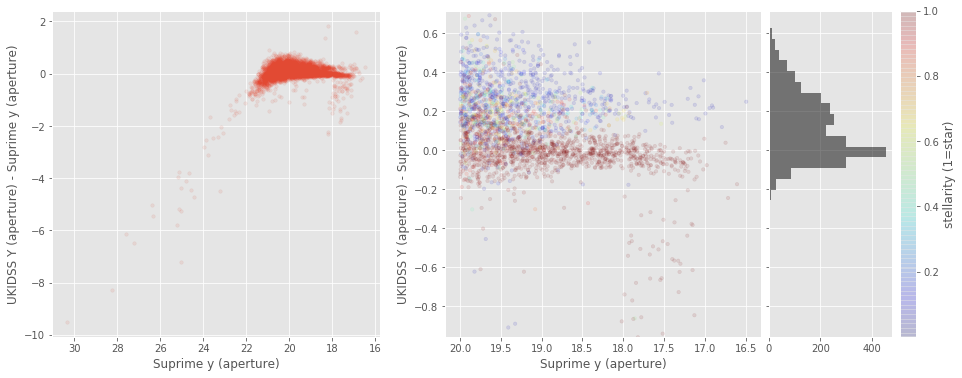

No sources have both RCS y (aperture) and VHS Y (aperture) values.

No sources have both RCS y (aperture) and UKIDSS Y (aperture) values.

No sources have both VHS Y (aperture) and UKIDSS Y (aperture) values.

UKIDSS J (aperture) - VHS J (aperture):


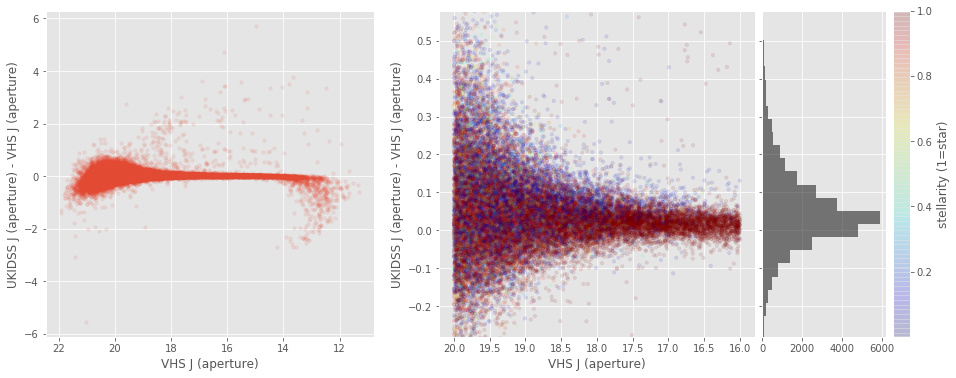

VICS82 J (aperture) - VHS J (aperture):


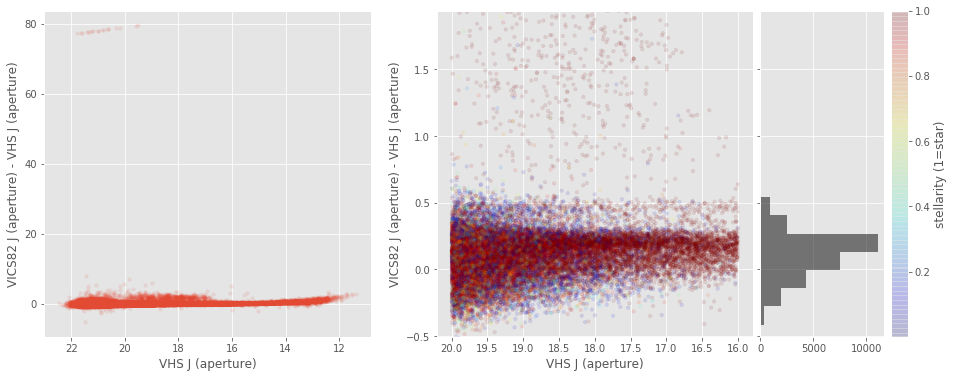

VICS82 J (aperture) - UKIDSS J (aperture):


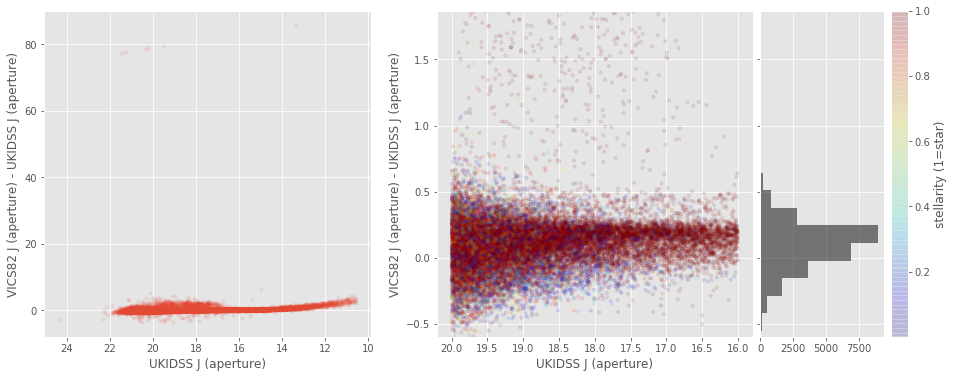

UKIDSS H (aperture) - VHS H (aperture):


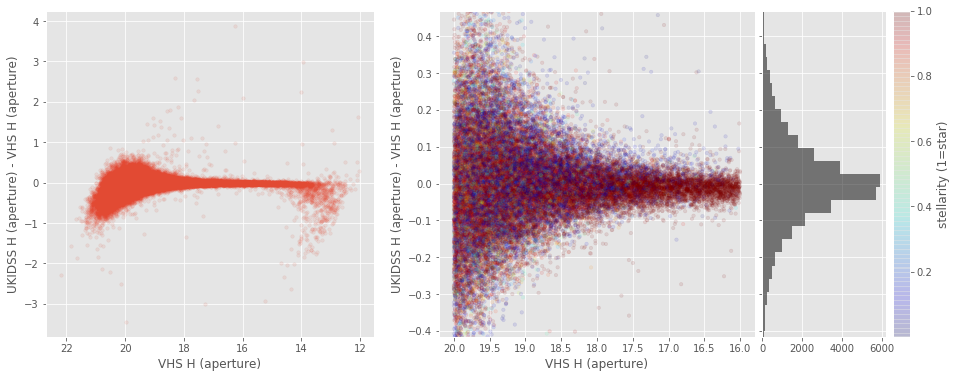

UKIDSS K (aperture) - VHS K (aperture):


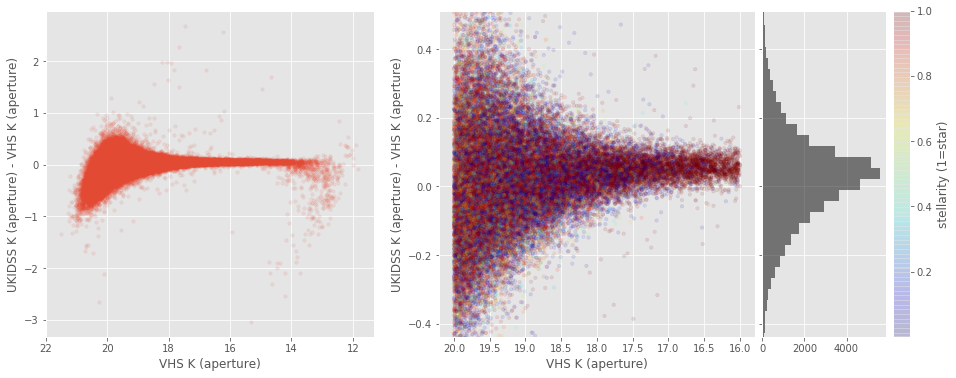

VICS82 K (aperture) - VHS K (aperture):


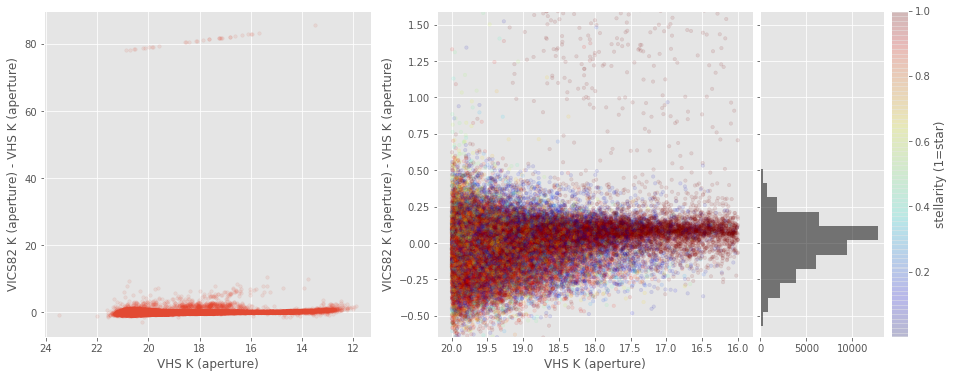

VICS82 K (aperture) - UKIDSS K (aperture):


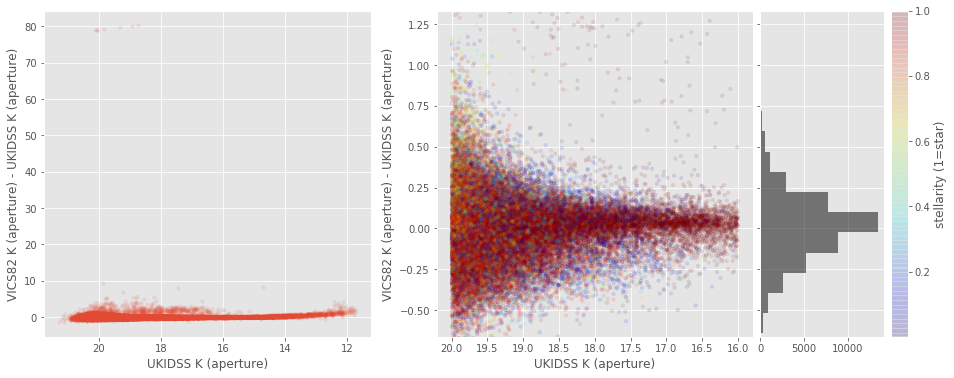

In [25]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
       
        if (basecol1 == "gpc1_r" and basecol2 == "sdss_r"):
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)

        apcor_check(master_catalogue[col1], master_catalogue[col2], master_catalogue['stellarity'],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)

for j in range(40):
    plt.close() 